Aluno: Tiago Amorim (RA: 100.675)

# GAN

### Objetivo
Nessa atividade você vai criar uma Generative Adversarial Network (GAN) *vanilla*. Mais especificamente, você vai construir e treinar uma GAN que é capaz de gerar imagens de dígitos manuscritos de 0 a 9. Nesse notebook, você usará o Pytorch. Se você não está familiarizado com esse framework, você pode acessar a documentação [PyTorch](https://pytorch.org/docs/stable/index.html).

### Objetivos de Aprendizagem
1.   Construir um gerador e um discriminador de uma GAN.
2.   Criar as funções de perda do gerador e do discriminador.
3.   Treinar e visualizar as imagens geradas pela GAN.


## Primeiros passos
Você começará importando alguns pacotes úteis e o conjunto de dados que você usará para construir e treinar sua GAN. Você também receberá uma função de visualizador para ajudar a investigar as imagens que sua GAN criará.

In [20]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), ax=None, title=None):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if ax is None:
        plt.axis('off')
        if title:
            plt.title(title)
        plt.show()
    else:
        ax.imshow(image_grid.permute(1, 2, 0).squeeze())
        ax.axis('off')
        if title:
            ax.set_title(title)

### Dataset MNIST
As imagens de treinamento que seu discriminador estará usando são do dataset  [MNIST](http://yann.lecun.com/exdb/mnist/). Ele contém 60.000 imagens de dígitos manuscritos de 0 a 9, como esses:
![MNIST Digits](https://th.bing.com/th/id/OIP.Ft2rLuO82eItlvJn5HOi9AAAAA?w=292&h=180&c=7&r=0&o=5&pid=1.7)

As imagens do MNIST têm baixa resolução, apenas 28x28, o que as torna ideais para um treinamento simples. Adicionalmente, essas imagens também têm apenas uma dimensão, ou banda de cor.

### Tensor
Você usará [tensores](https://pytorch.org/docs/stable/tensors.html). Tensores são uma generalização de matrizes: por exemplo, uma pilha de três matrizes com os valores de pixel de red, green e blue em diferentes pontos de uma matriz de 64 x 64 pixels é um tensor de *shape* 3 x 64 x 64.

Tensores são fáceis de serem manipulados e são suportados pela biblioteca [PyTorch](https://pytorch.org/). Tensores são matrizes ou vetores multidimensionais.

### Batches

Enquanto você pode treinar seu modelo imagem de treinamento por imagem de treinamento, isso é extremamente ineficiente e leva a um treinamento menos estável. Em GANs, e em aprendizado de máquina em geral, tipicamente se processa múltiplas imagens por passo de treinamento. Em outras palavras, as imagens são treinadas em lotes, ou *batches*.

Isso significa que seu gerador irá gerar todo um lote de imagens e receber do discriminador um *feedback* antes de atualizar o modelo. O mesmo ocorre para o discriminador, que calculará a perda (*loss*) em todo o *batch* de imagens geradas e reais, antes do modelo ser atualizado.

## Generator

O primeiro passo será a criação de um componente gerador (*Generator*).

Você começará criando uma função para fazer uma única camada/bloco para a rede neural do gerador. Cada bloco deve incluir uma [transformação linear](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) para mapear para outro *shape*, um [*batch normalization*](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) para estabilização e, finalmente, uma função de ativação não linear (no caso usaremos uma [ReLU](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) para que a saída possa ser transformada de maneiras complexas.

Analise o código e os comentários da função a seguir e siga as instruções.


In [2]:
# Replace None by the correct dimensions
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        #### END CODE HERE ####
        nn.ReLU(inplace=True)
    )

In [3]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU

    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Agora você pode construir a classe do gerador. Ela receberá 3 valores:

*   A dimensão do vetor de ruído
*   A dimensão da imagem
*   A dimensão inicial oculta

Usando esses valores, o gerador construirá uma rede neural com 5 camadas/blocos. Começando com o vetor de ruído, o gerador aplicará transformações não lineares através da função de bloco até que o tensor seja mapeado para o tamanho da imagem a ser gerada (o mesmo tamanho das imagens reais do MNIST). Você precisará preencher o código para a camada final, pois ela é diferente das outras. A camada final não precisa de normalização ou função de ativação, mas precisa ser escalada com uma função [sigmoide](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html).

Finalmente, você recebe uma função *forward* que recebe um vetor de ruído e gera uma imagem da dimensão de saída usando sua rede neural.

<details>

<summary>
<font size="3" color="green">
<b>Dicas opcionais para o <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. O tamanho da saída da última transformação linear deve ser im_dim, mas lembre-se que você deve escalar as saídas entre 0 e 1 usando a função sigmoide..
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) e [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) podem ser úteis aqui.
</details>


In [4]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them!
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)

    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [5]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()

    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.min() < 0.5, "Don't use a block in your solution"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Ruído
Para poder usar seu gerador, você precisará ser capaz de criar vetores de ruído. O vetor de ruído z tem o papel importante de garantir que as imagens geradas da mesma classe não pareçam todas iguais -- pense nele como uma semente aleatória. Você o gerará aleatoriamente usando PyTorch, amostrando números aleatórios da distribuição normal. Como várias imagens serão processadas por passagem, você gerará todos os vetores de ruído de uma vez.

Observe que sempre que você criar um novo tensor usando `torch.ones`, `torch.zeros` ou `torch.randn`, você precisará criá-lo no dispositivo de destino, por exemplo, `torch.ones(3, 3, device=device)`, ou movê-lo para o dispositivo de destino usando `torch.ones(3, 3).to(device)`. Você não precisa fazer isso se estiver criando um tensor manipulando outro tensor ou usando uma variação que define o dispositivo como o padrão para a entrada, como `torch.ones_like`. Em geral, use `torch.ones_like` e `torch.zeros_like` em vez de `torch.ones` ou `torch.zeros` sempre que possível.

<details>

<summary>
<font size="3" color="green">
<b>Dica opcional para <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1.
Você provavelmente achará torch.randn útil aqui.
</details>


In [6]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples, z_dim, device=device)
    #### END CODE HERE ####

In [7]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)

    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
O segundo componente que você precisa construir é o discriminador. Assim como no componente gerador, você começará criando uma função que constrói um bloco de rede neural para o discriminador.

*Nota: Aqui se utiliza leaky ReLUs para evitar o problema do "dying ReLU", que se refere ao fenômeno onde os parâmetros param de mudar devido a valores consistentemente negativos passados para um ReLU, resultando em um gradiente zero.*

In [8]:
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation
          followed by an nn.LeakyReLU activation with negative slope of 0.2
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(negative_slope=0.2, inplace=True)
        #### END CODE HERE ####
    )

In [9]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)

    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Agora você pode usar esses blocos para fazer um discriminador! A classe do discriminador possui 2 valores:

*   A dimensão da imagem
*   A dimensão oculta

O discriminador construirá uma rede neural com 4 camadas. Ele começará com o tensor da imagem e o transformará até retornar um único número (tensor de 1 dimensão) como saída. Essa saída classifica se uma imagem é falsa ou real. Observe que você não precisa de uma função sigmoide após a camada de saída, pois ela está incluída na função de perda. Finalmente, para usar a rede neural do seu discriminador, você recebe uma função de passagem *forward* que recebe um tensor de imagem a ser classificado.

In [10]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor,
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)

    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [11]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):

    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

    # Don't use a block
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Treinamento
Agora você pode juntar tudo!

Primeiro, você definirá seus parâmetros:
  *   criterion: a função de perda
  *   n_epochs: o número de vezes que você percorre todo o conjunto de dados durante o treinamento
  *   z_dim: a dimensão do vetor de ruído
  *   display_step: com que frequência exibir/visualizar as imagens
  *   batch_size: o número de imagens por passagem forward/backward
  *   lr: a taxa de aprendizado
  *   device: o tipo de dispositivo, aqui usando uma GPU (que executa CUDA), não CPU

Em seguida, você carregará o conjunto de dados MNIST como tensores usando um dataloader.

In [23]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 1000
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

Agora, você pode inicializar seu gerador, discriminador e otimizadores. Observe que cada otimizador só leva os parâmetros de um modelo específico, pois queremos que cada otimizador otimize apenas um dos modelos.

In [24]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Antes de treinar sua GAN, você precisará criar funções para calcular a perda do discriminador e a perda do gerador. É assim que o discriminador e o gerador saberão como estão se saindo e melhorarão a si mesmos. Como o gerador é necessário ao calcular a perda do discriminador, você precisará chamar `.detach()` no resultado do gerador para garantir que apenas o discriminador seja atualizado!

Lembre-se de que você já definiu uma função de perda anteriormente (`criterion`) e é recomendável usar `torch.ones_like` e `torch.zeros_like` em vez de `torch.ones` ou `torch.zeros`. Se você usar `torch.ones` ou `torch.zeros`, precisará passar `device=device` para elas.

In [25]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare
               the discriminator's predictions to the ground truth reality of the images
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce,
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images.
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a
    #            'ground truth' tensor in order to calculate the loss.
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    noise = get_noise(num_images, z_dim, device)
    fake_img = gen(noise).detach()
    fake_pred = disc(fake_img)
    loss_fake = criterion(fake_pred, torch.zeros_like(fake_pred))

    real_pred = disc(real)
    loss_real = criterion(real_pred, torch.ones_like(real_pred))

    disc_loss = (loss_fake + loss_real) / 2.0
    #### END CODE HERE ####
    return disc_loss

In [26]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None

    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)

    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device)
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data

        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")


Success!


In [27]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare
               the discriminator's predictions to the ground truth reality of the images
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce,
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images.
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    noise = get_noise(num_images, z_dim, device)
    fake_img = gen(noise)
    fake_pred = disc(fake_img)
    fake_true = torch.ones_like(fake_pred)
    gen_loss = criterion(fake_pred, fake_true)
    #### END CODE HERE ####
    return gen_loss

In [28]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None

    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)


def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device)
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)

    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finalmente, você pode juntar tudo! Para cada época, você processará todo o conjunto de dados em *batches*. Para cada lote, você precisará atualizar o discriminador e o gerador usando suas perdas. *Batches* são conjuntos de imagens que serão previstas antes que as funções de perda sejam calculadas (em vez de calcular a função de perda após cada imagem). Observe que você pode ver uma perda maior que 1, isso é normal, pois a perda de entropia cruzada binária pode ser qualquer número positivo para um palpite errado suficientemente confiante.

É comum que o discriminador supere o gerador, especialmente no início, porque seu trabalho é mais fácil. É importante que nenhum dos dois fique muito bom (ou seja, com precisão quase perfeita), o que faria com que todo o modelo parasse de aprender. Equilibrar os dois modelos é realmente muito difícil de fazer em uma GAN padrão e tipicamente exige alguns experimentos.

Depois de enviar uma versão funcional com a arquitetura original, sinta-se à vontade para brincar com a arquitetura se quiser ver como diferentes escolhas arquitetônicas podem levar a GANs melhores ou piores. Por exemplo, considere mudar o tamanho da dimensão oculta ou tornar as redes mais rasas ou mais profundas, alterando o número de camadas.

Você deve esperar ver aproximadamente esta progressão. Em uma GPU, isso deve levar cerca de 15 segundos por 500 etapas, em média, enquanto em uma CPU levará aproximadamente 1.5 minutos:

![MNIST Digits](https://drive.google.com/uc?export=view&id=1BlfFNZACaieFrOjMv_o2kGqwAR6eiLmN)


  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.733, discriminator loss: 0.322


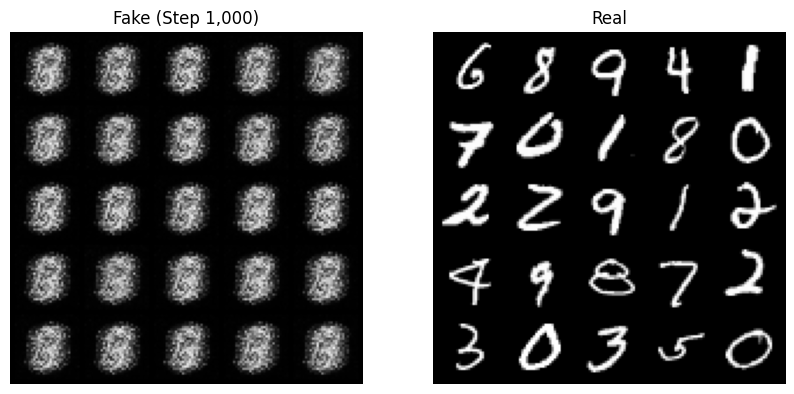

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 2.047, discriminator loss: 0.1647


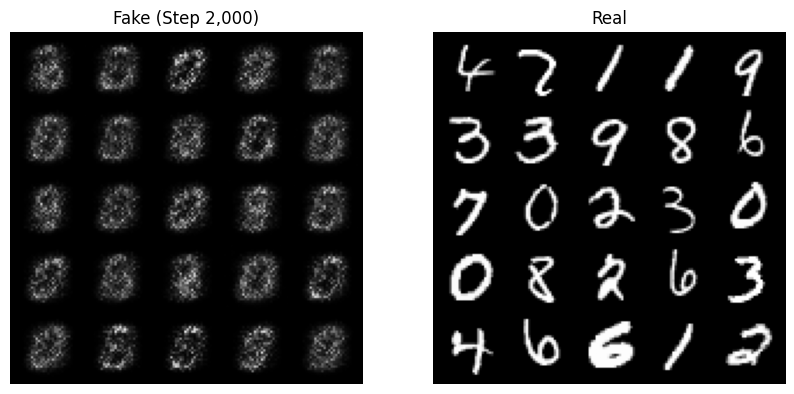

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 1.74, discriminator loss: 0.2093


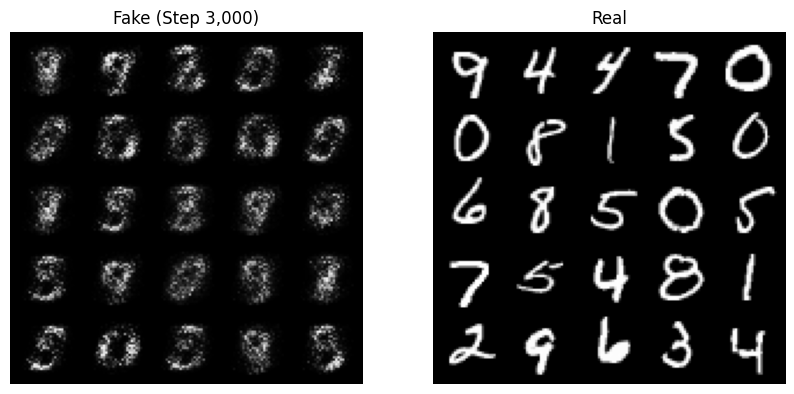

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.409, discriminator loss: 0.1383


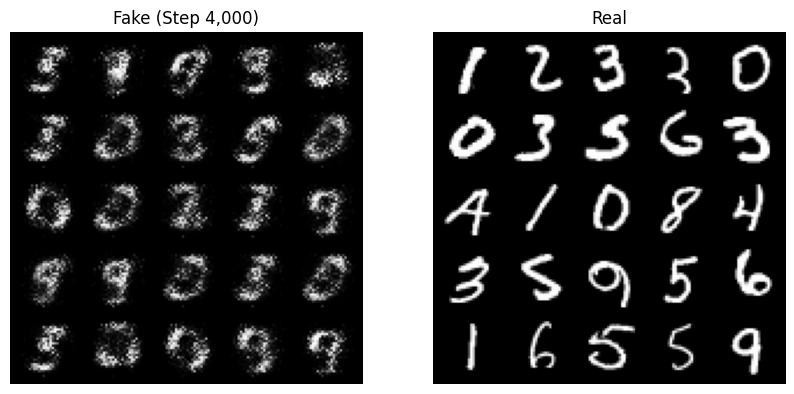

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.129, discriminator loss: 0.09281


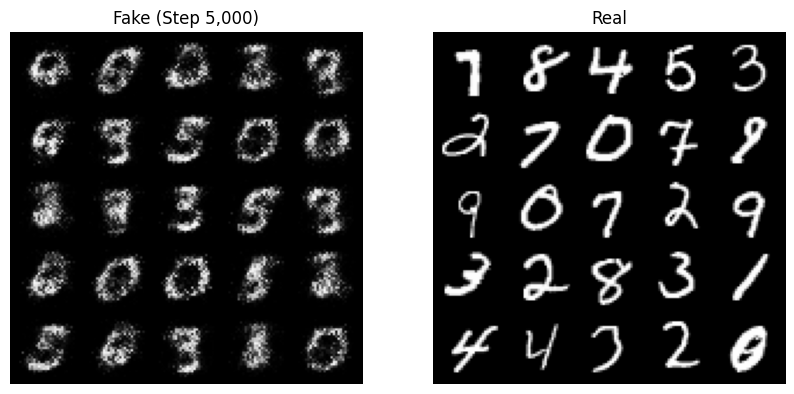

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 3.539, discriminator loss: 0.07775


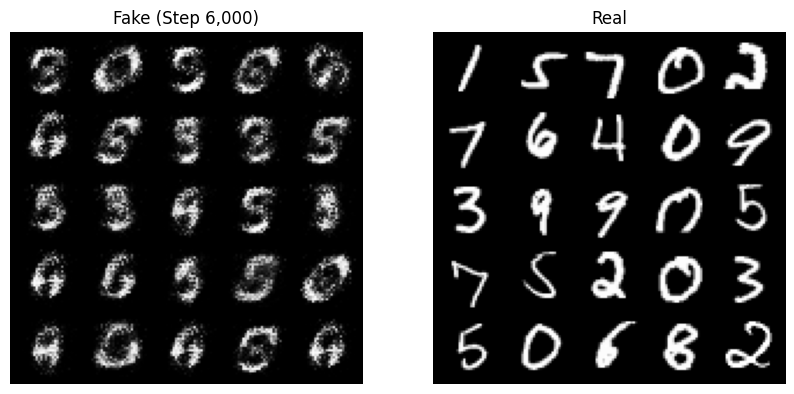

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 3.8, discriminator loss: 0.06695


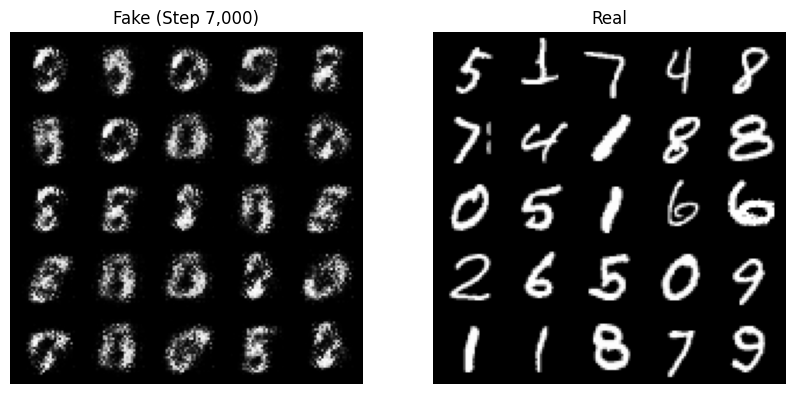

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 3.956, discriminator loss: 0.07276


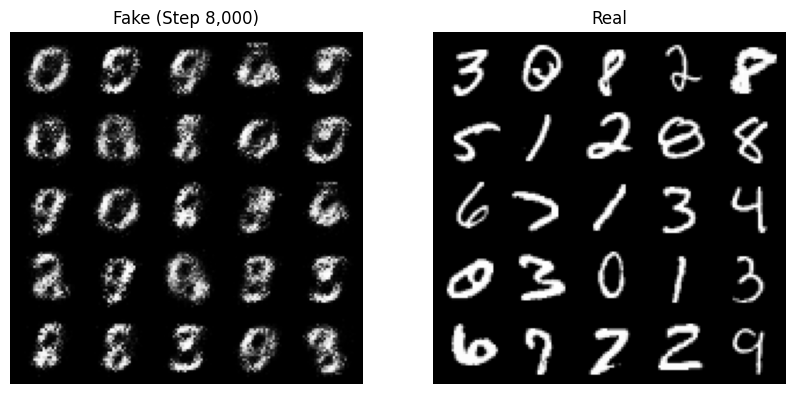

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 4.083, discriminator loss: 0.06883


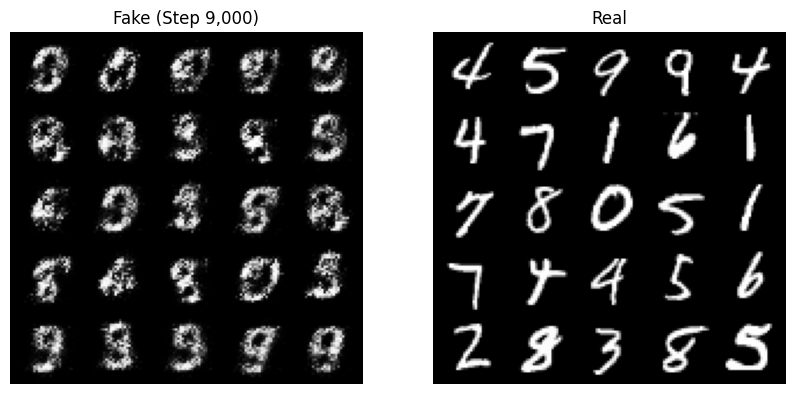

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 4.093, discriminator loss: 0.07061


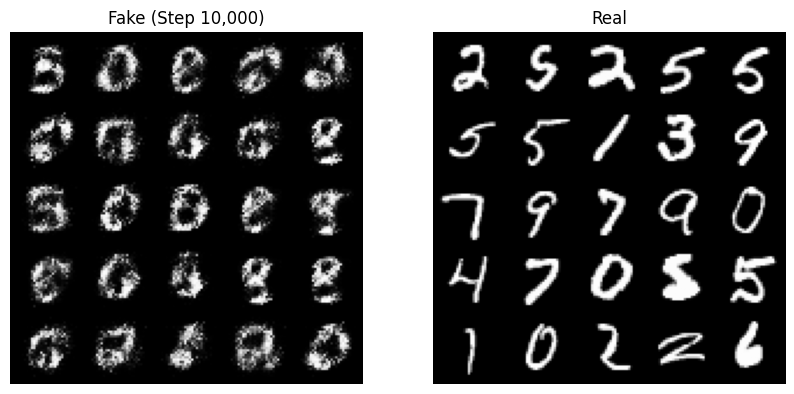

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 4.14, discriminator loss: 0.07691


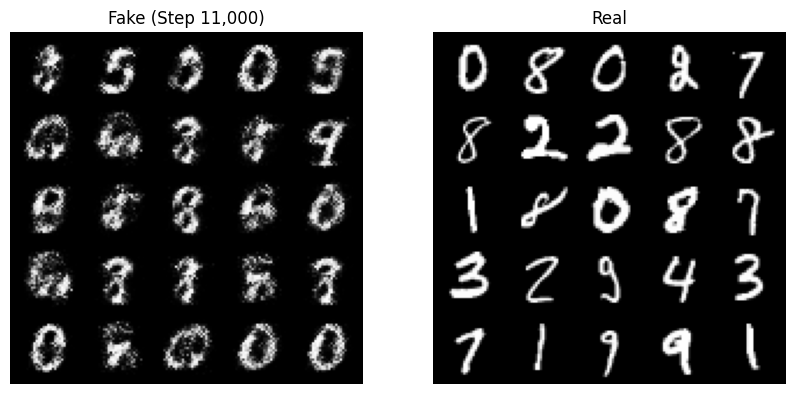

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 4.054, discriminator loss: 0.08579


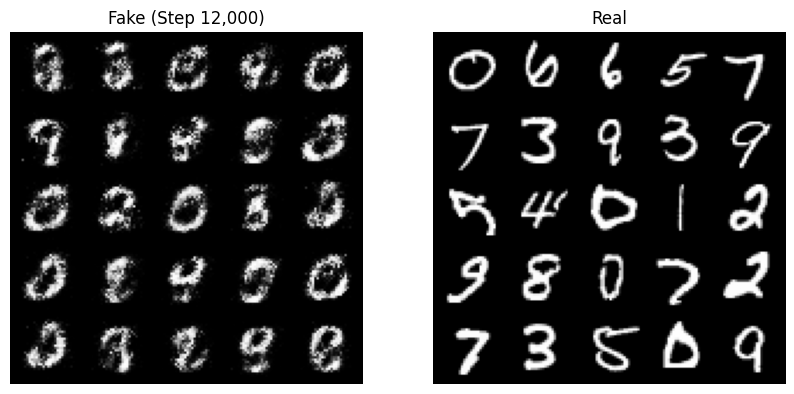

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 3.847, discriminator loss: 0.08804


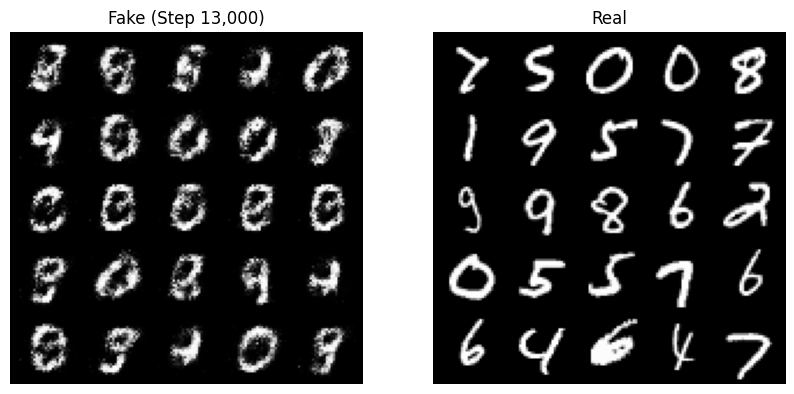

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 3.855, discriminator loss: 0.09431


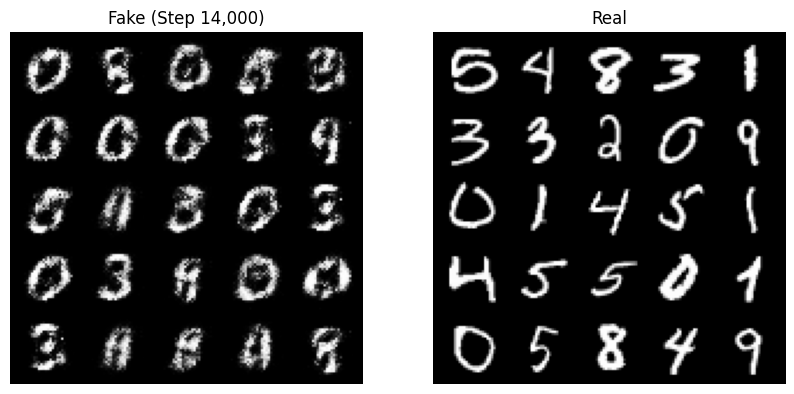

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.728, discriminator loss: 0.1038


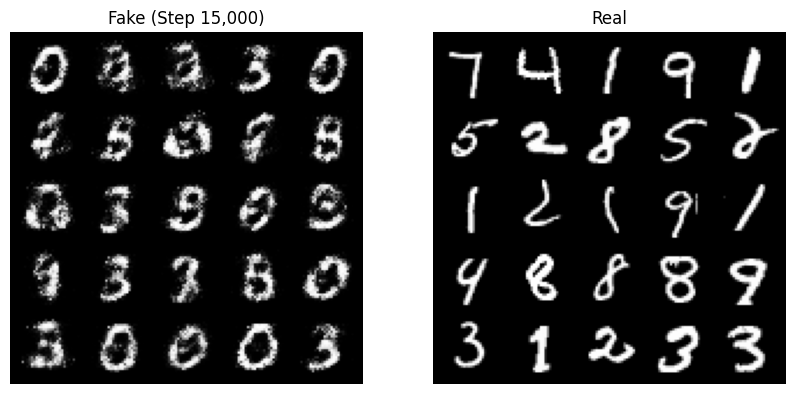

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.701, discriminator loss: 0.1283


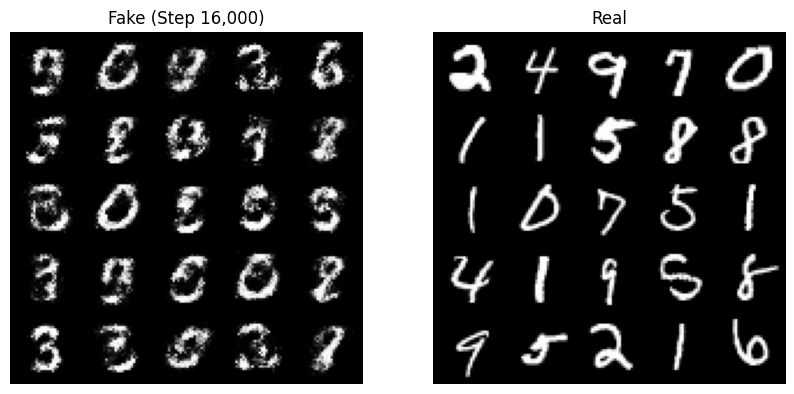

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.477, discriminator loss: 0.1342


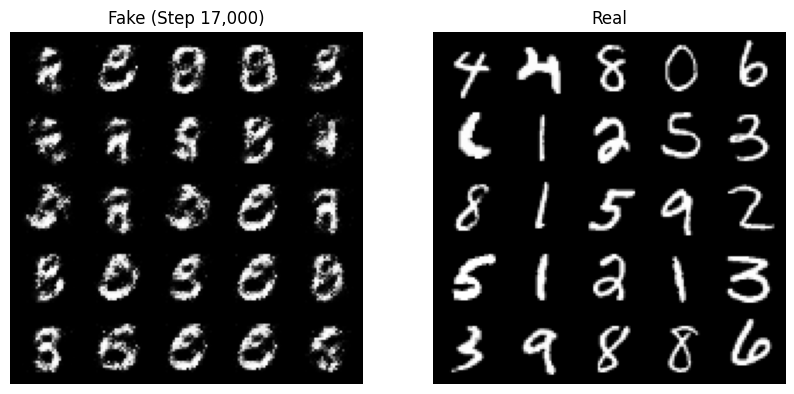

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.54, discriminator loss: 0.1312


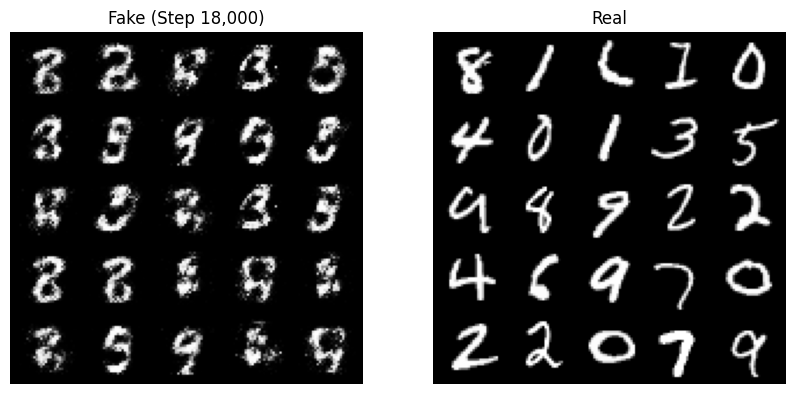

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.379, discriminator loss: 0.1518


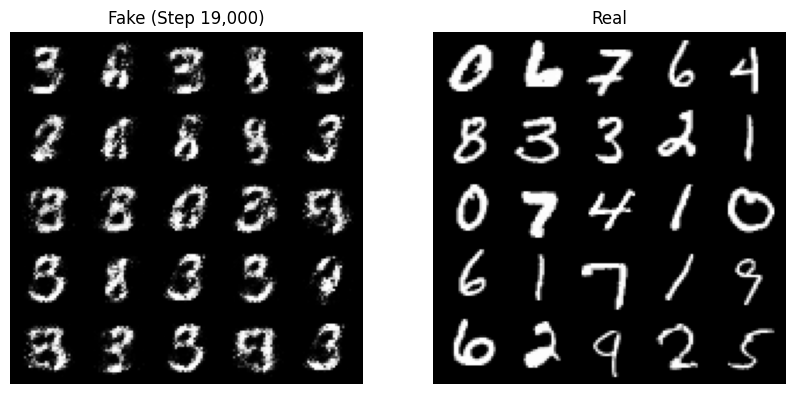

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.248, discriminator loss: 0.1635


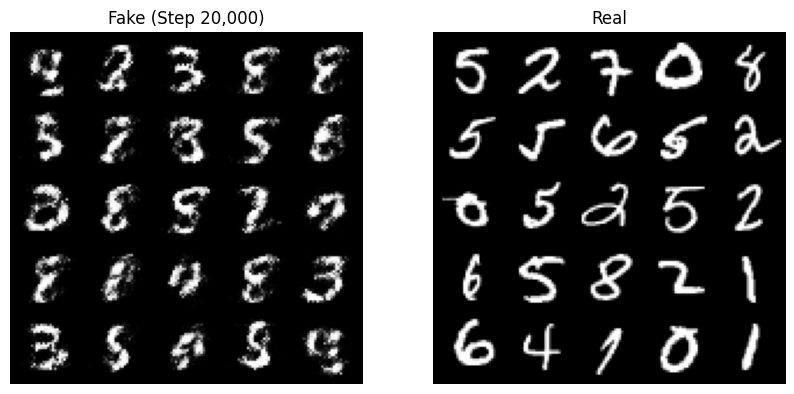

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 3.393, discriminator loss: 0.1633


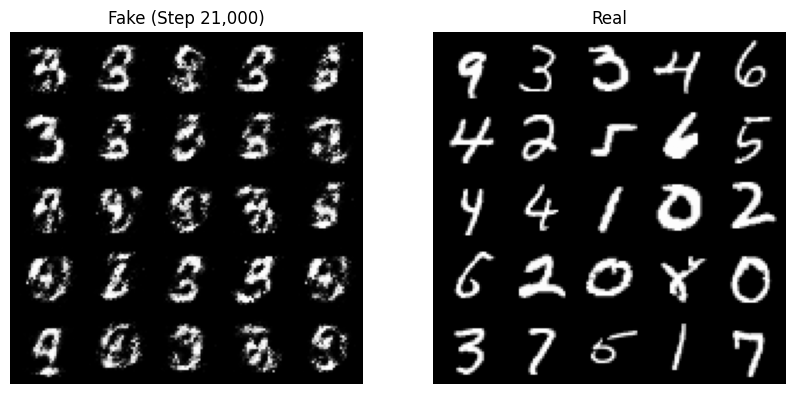

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 3.141, discriminator loss: 0.1794


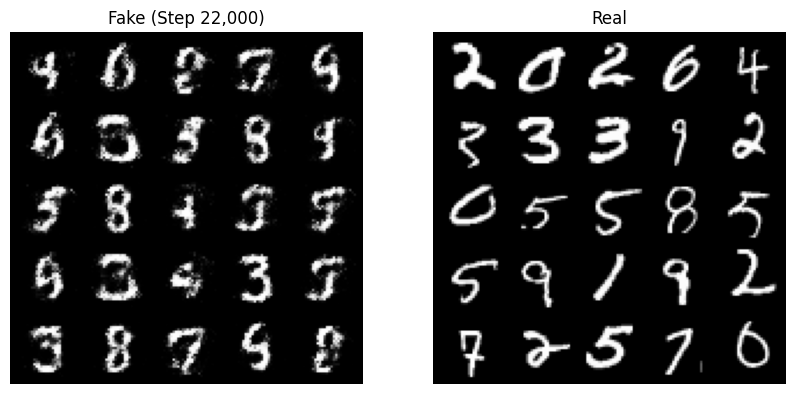

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 3.051, discriminator loss: 0.1837


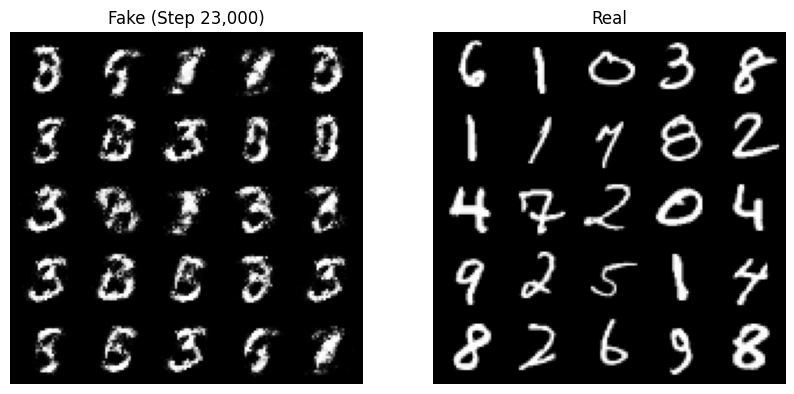

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 2.953, discriminator loss: 0.1987


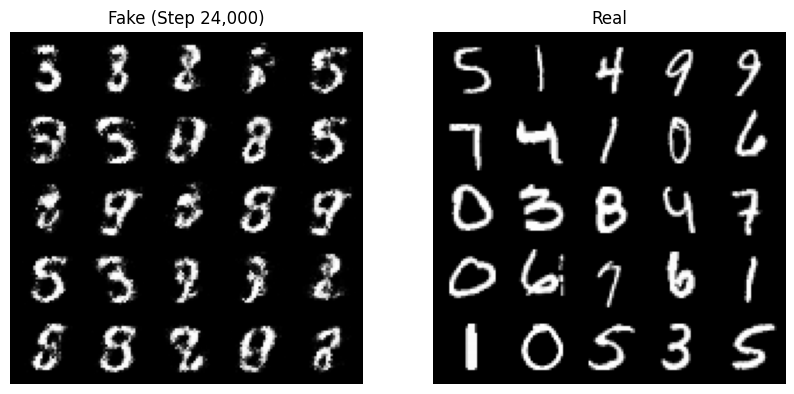

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 2.902, discriminator loss: 0.2055


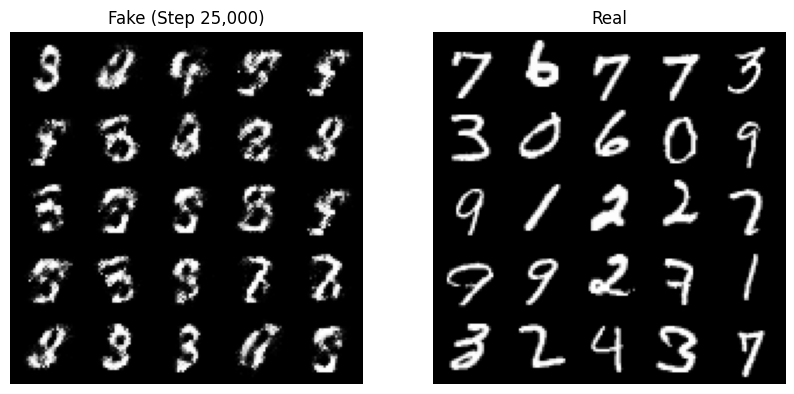

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 2.905, discriminator loss: 0.1945


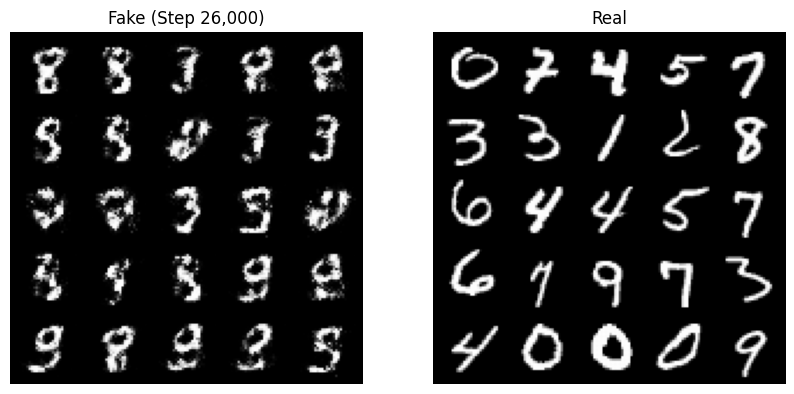

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 2.859, discriminator loss: 0.2076


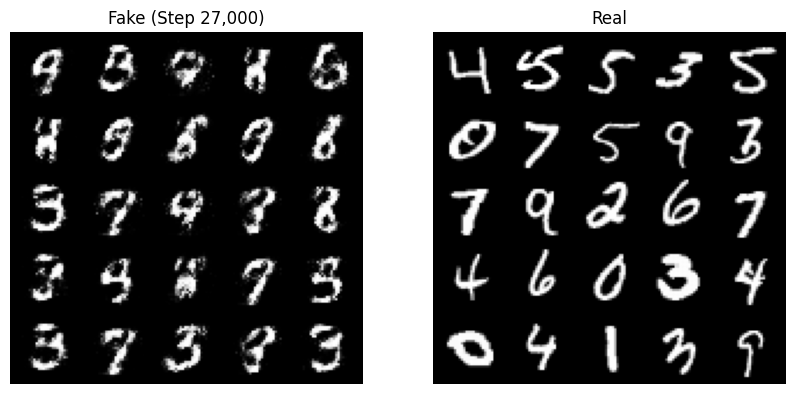

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 2.779, discriminator loss: 0.2226


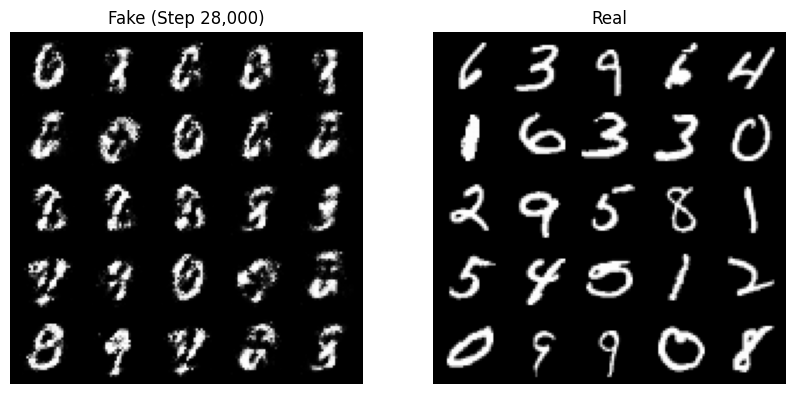

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 2.81, discriminator loss: 0.2137


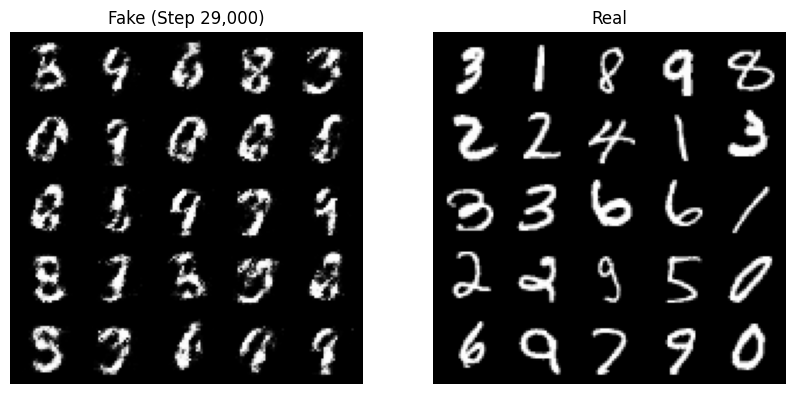

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 2.732, discriminator loss: 0.2303


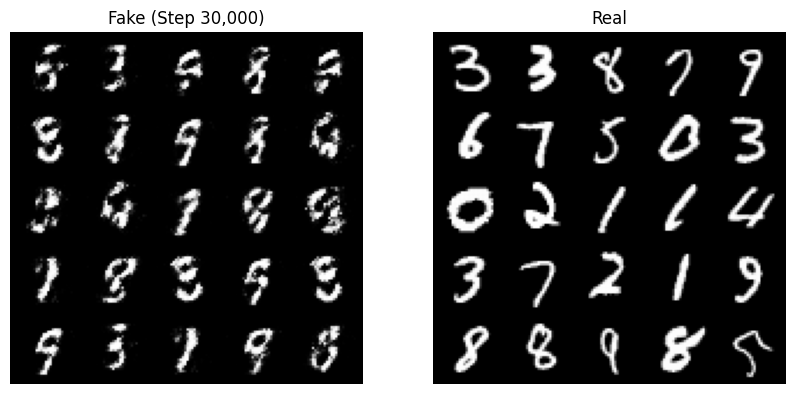

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 2.649, discriminator loss: 0.2291


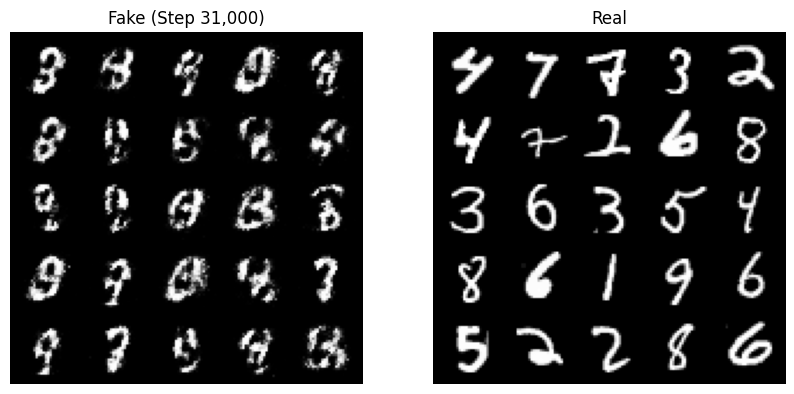

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.704, discriminator loss: 0.2201


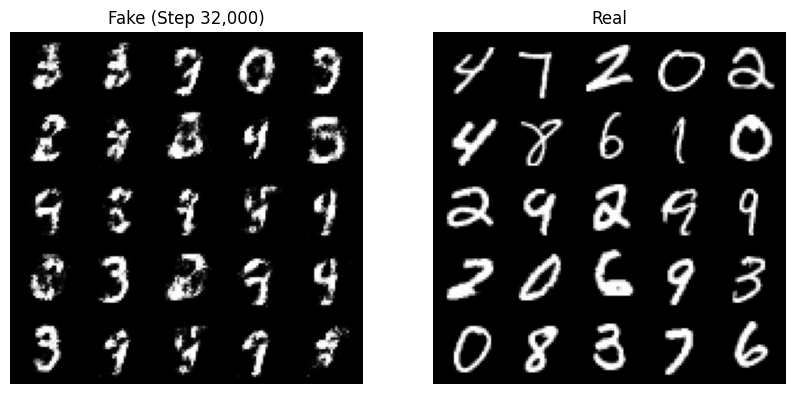

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.643, discriminator loss: 0.2446


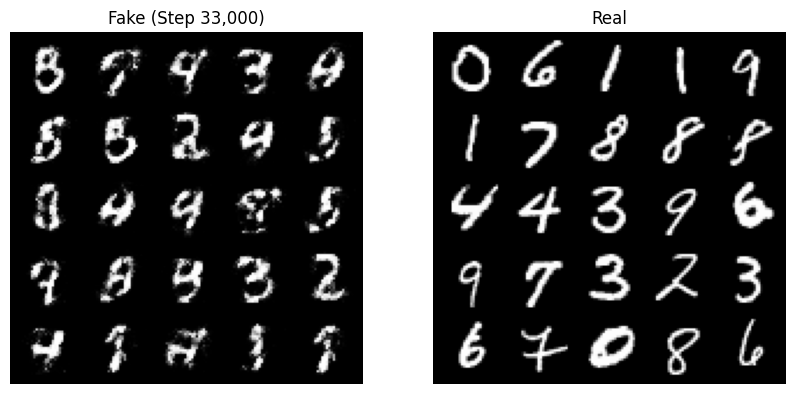

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 2.495, discriminator loss: 0.2733


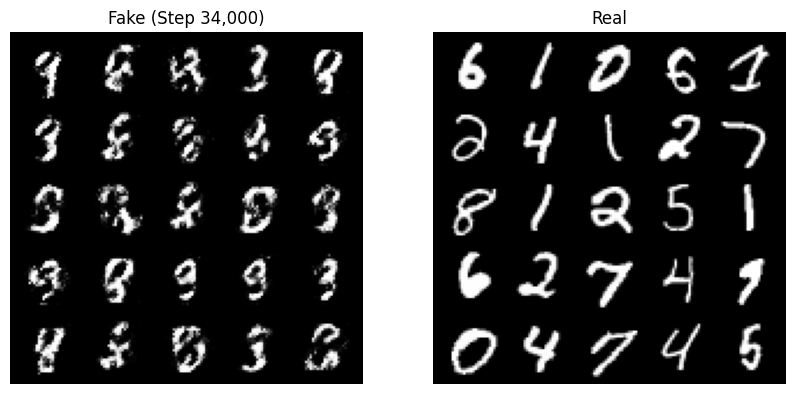

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 2.448, discriminator loss: 0.2598


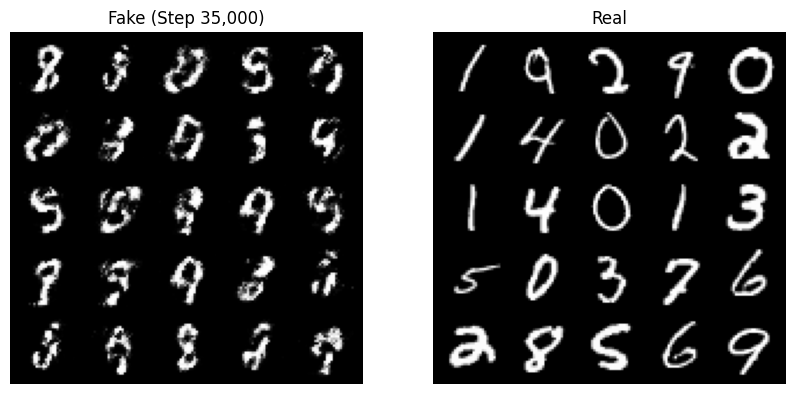

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 2.502, discriminator loss: 0.2577


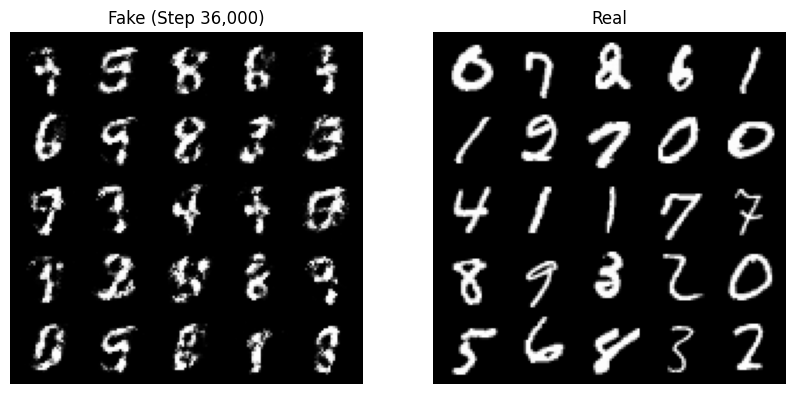

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 2.344, discriminator loss: 0.2991


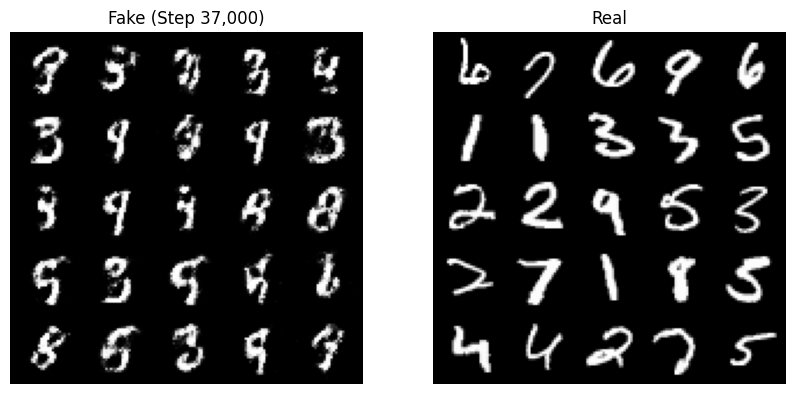

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 2.407, discriminator loss: 0.272


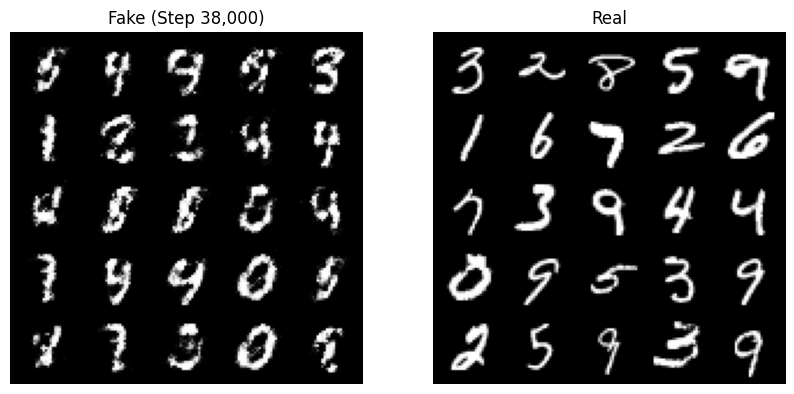

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 2.358, discriminator loss: 0.2926


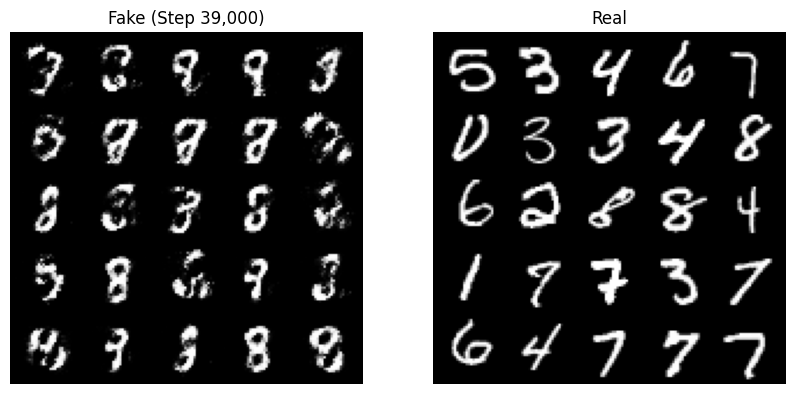

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 2.315, discriminator loss: 0.3051


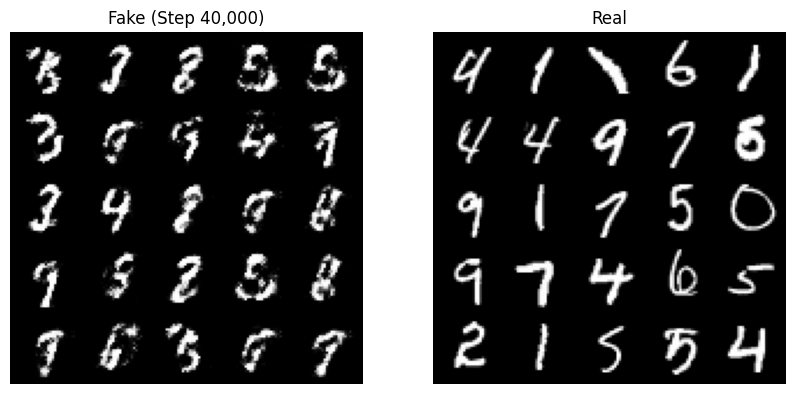

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 2.204, discriminator loss: 0.3135


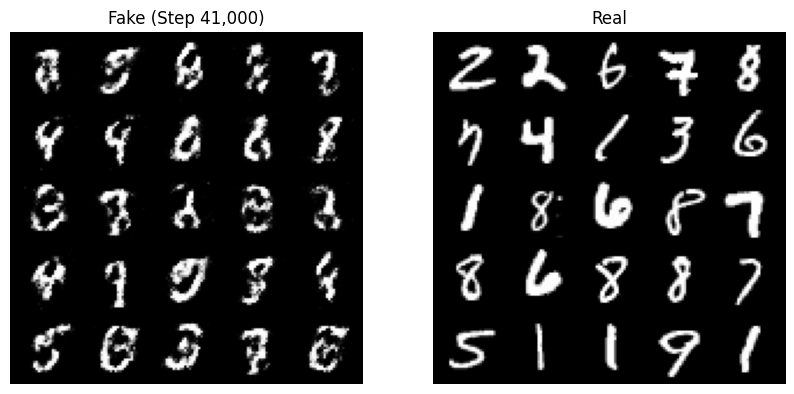

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 2.196, discriminator loss: 0.32


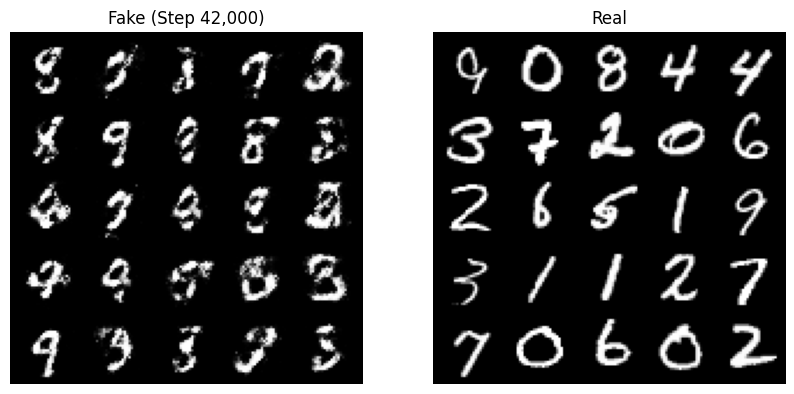

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 2.109, discriminator loss: 0.3255


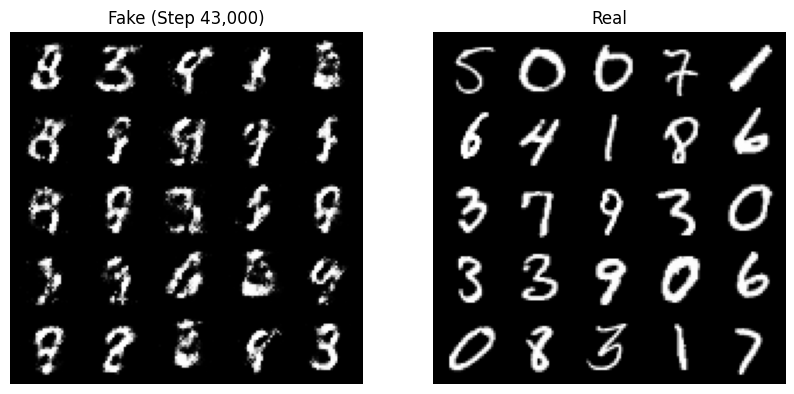

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 2.115, discriminator loss: 0.3085


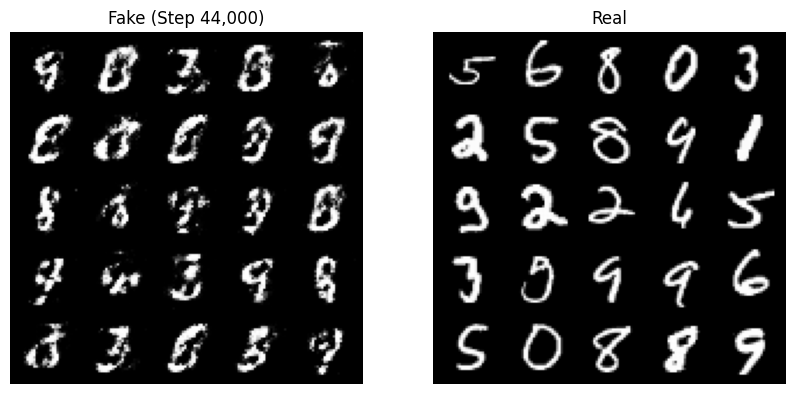

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 2.196, discriminator loss: 0.2978


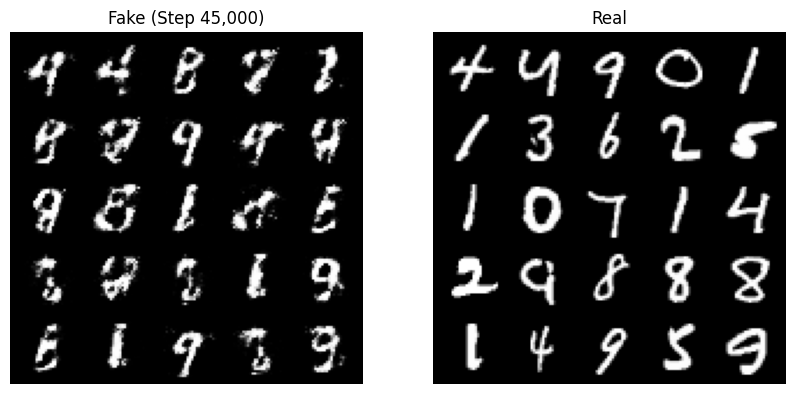

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 2.173, discriminator loss: 0.2947


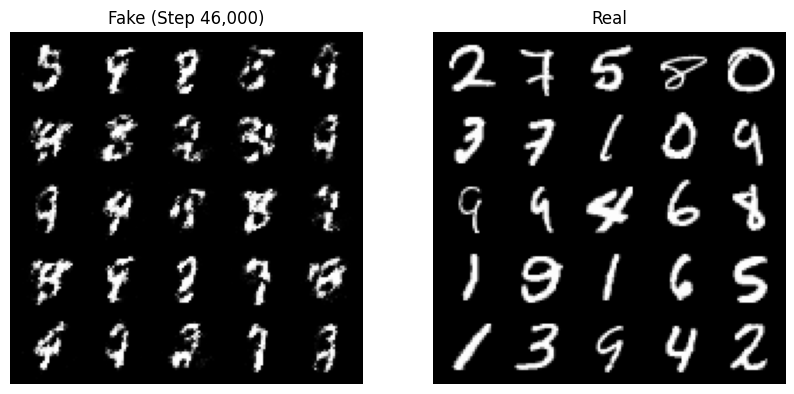

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47000: Generator loss: 2.195, discriminator loss: 0.304


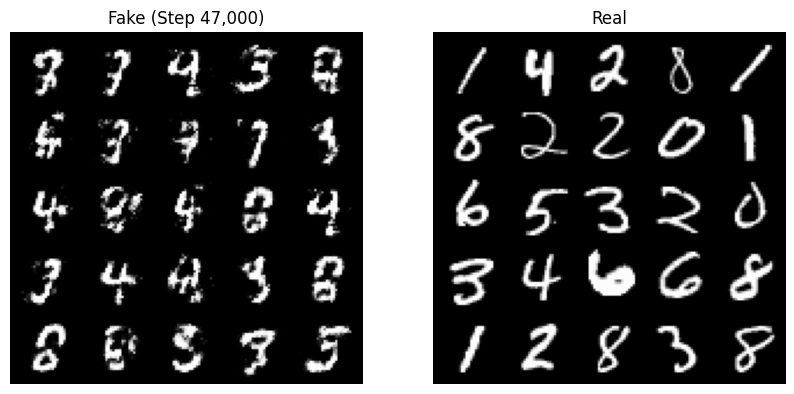

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48000: Generator loss: 2.125, discriminator loss: 0.3214


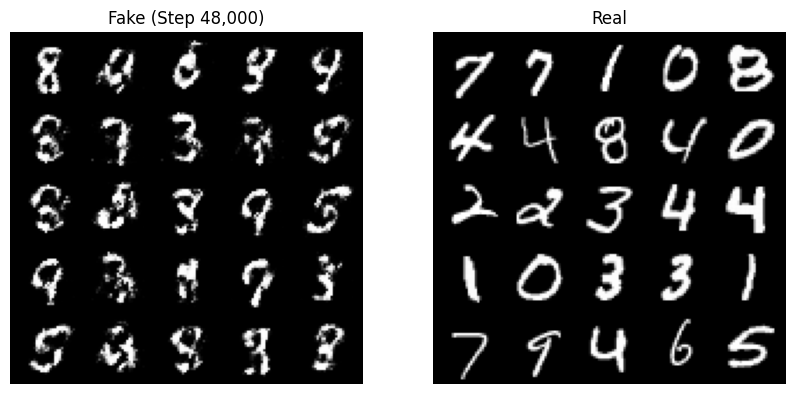

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49000: Generator loss: 2.051, discriminator loss: 0.3326


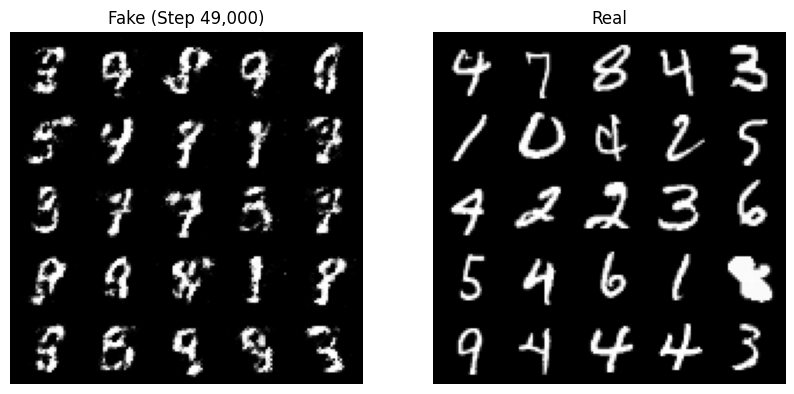

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50000: Generator loss: 2.084, discriminator loss: 0.3181


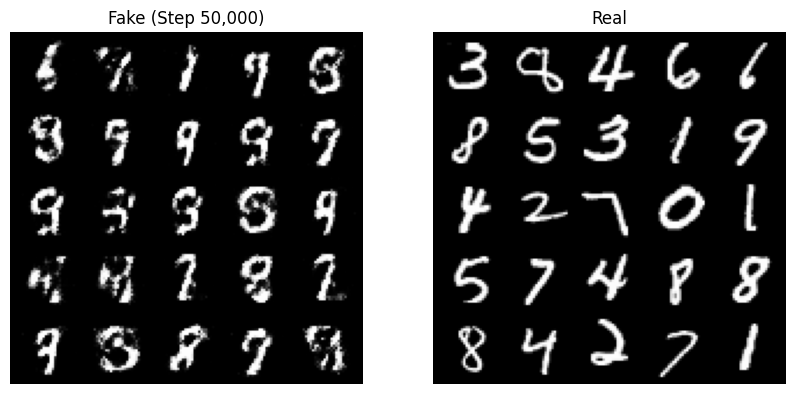

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51000: Generator loss: 1.93, discriminator loss: 0.3462


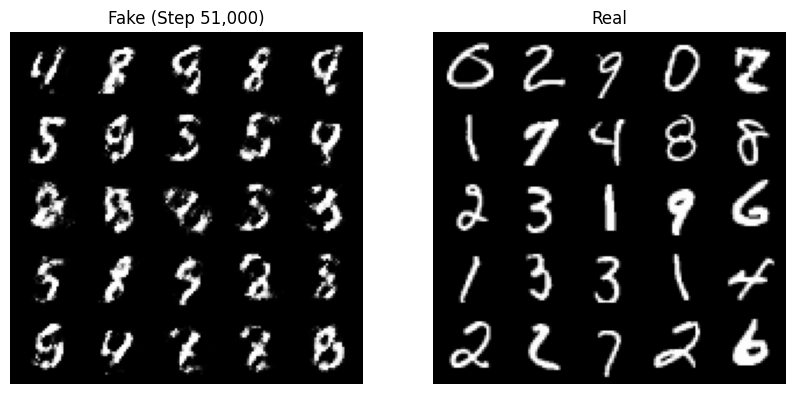

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52000: Generator loss: 1.978, discriminator loss: 0.3342


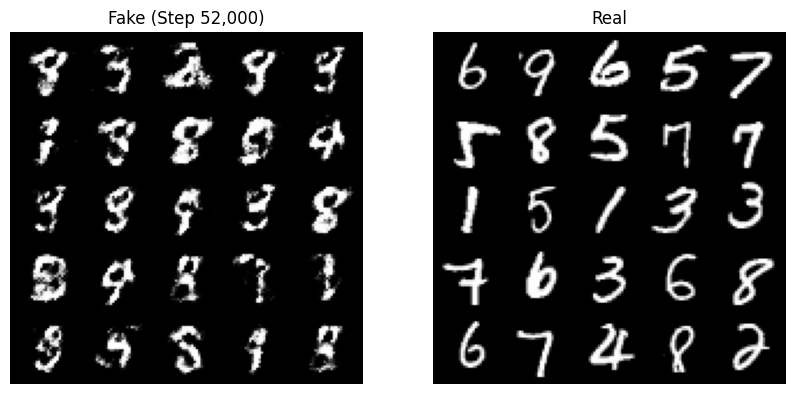

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53000: Generator loss: 1.941, discriminator loss: 0.3459


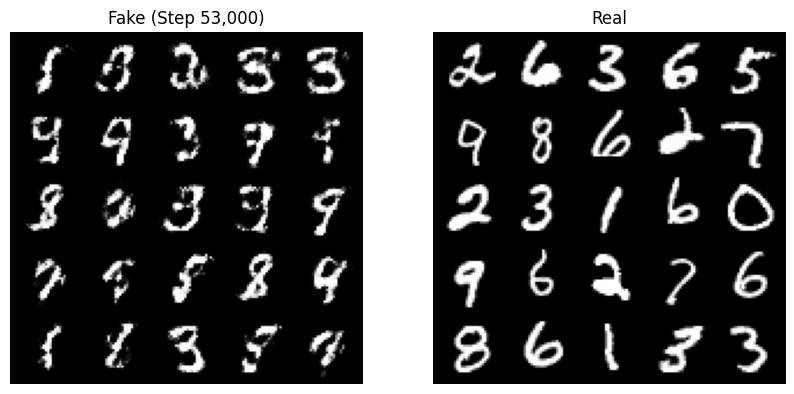

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54000: Generator loss: 1.836, discriminator loss: 0.3692


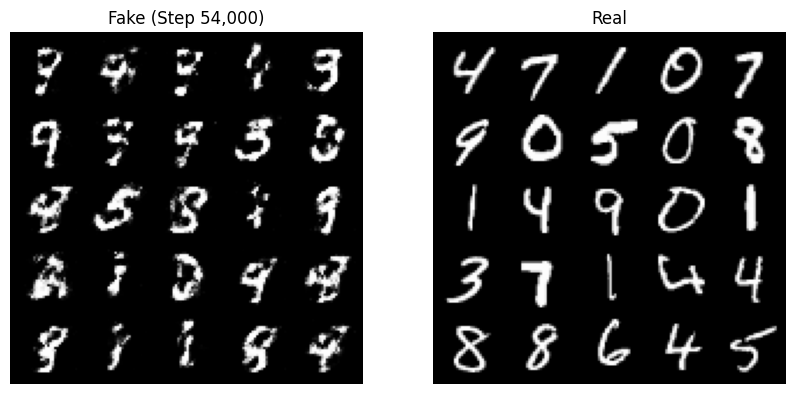

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55000: Generator loss: 1.857, discriminator loss: 0.3556


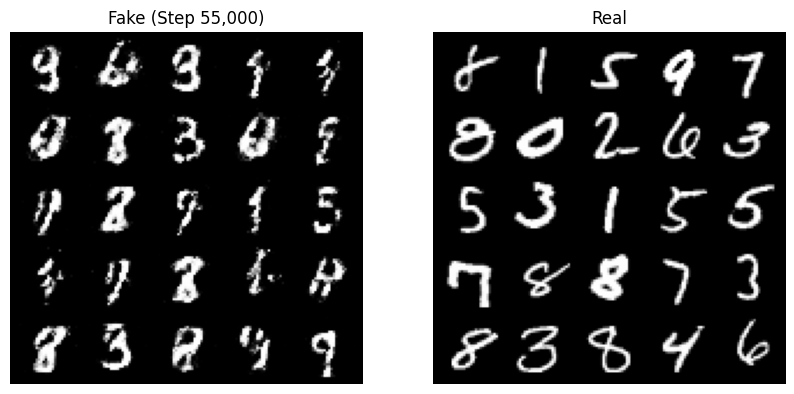

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56000: Generator loss: 1.832, discriminator loss: 0.3668


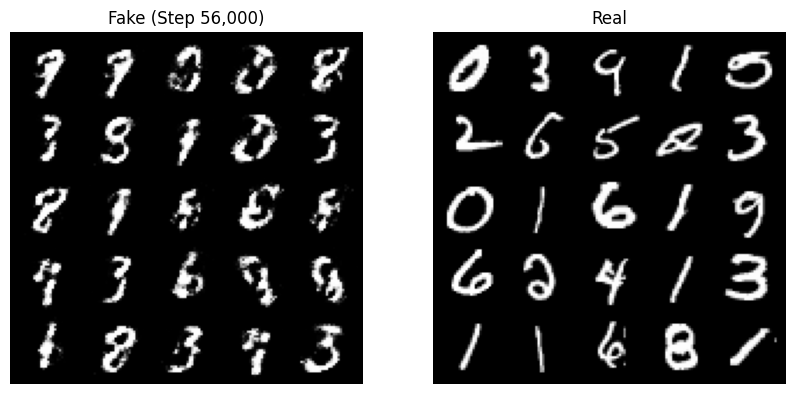

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57000: Generator loss: 1.819, discriminator loss: 0.3865


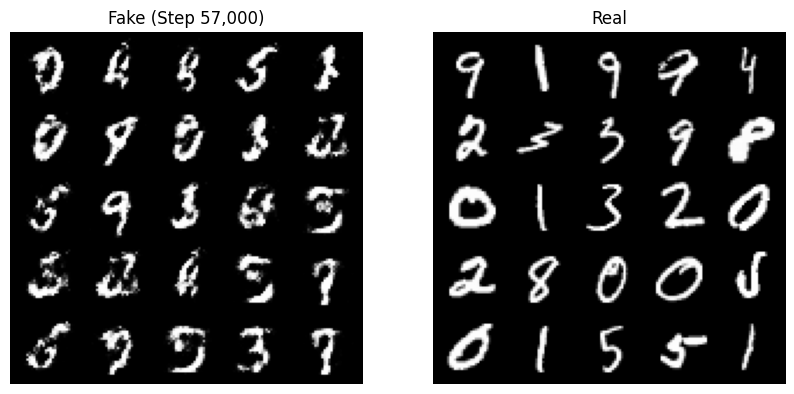

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58000: Generator loss: 1.816, discriminator loss: 0.3718


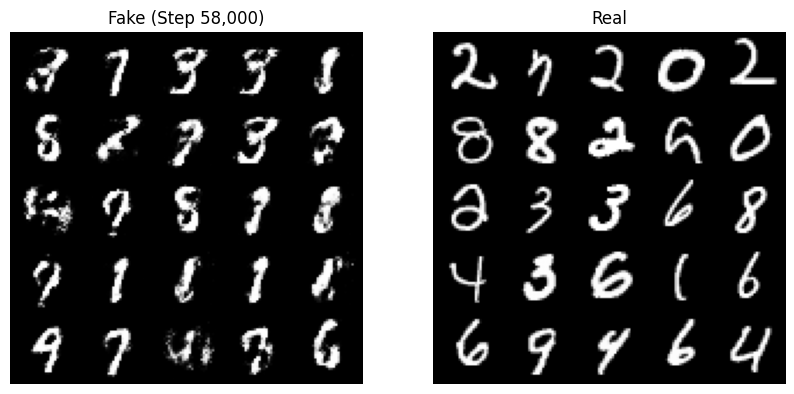

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59000: Generator loss: 1.797, discriminator loss: 0.3808


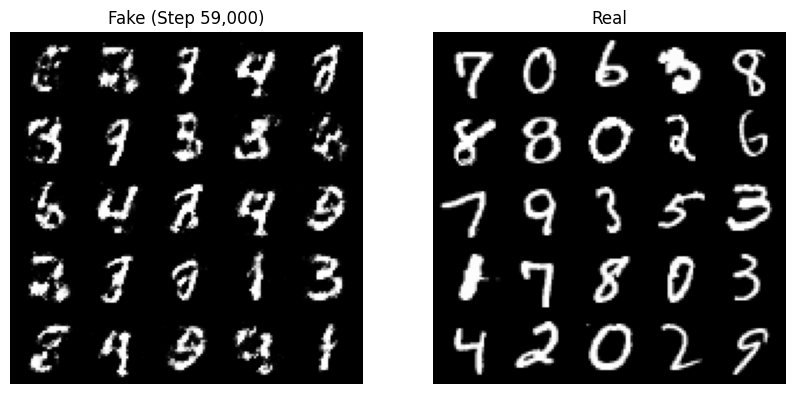

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60000: Generator loss: 1.793, discriminator loss: 0.3786


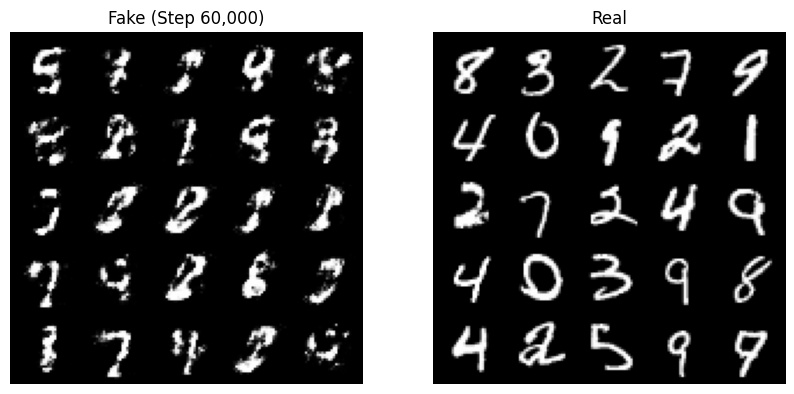

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61000: Generator loss: 1.778, discriminator loss: 0.383


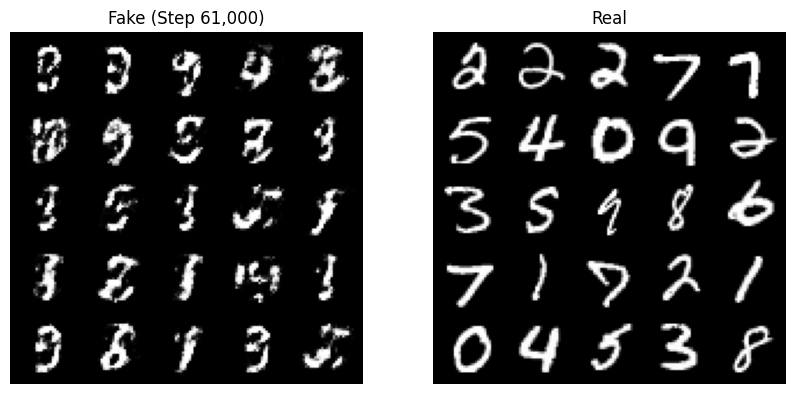

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62000: Generator loss: 1.739, discriminator loss: 0.3952


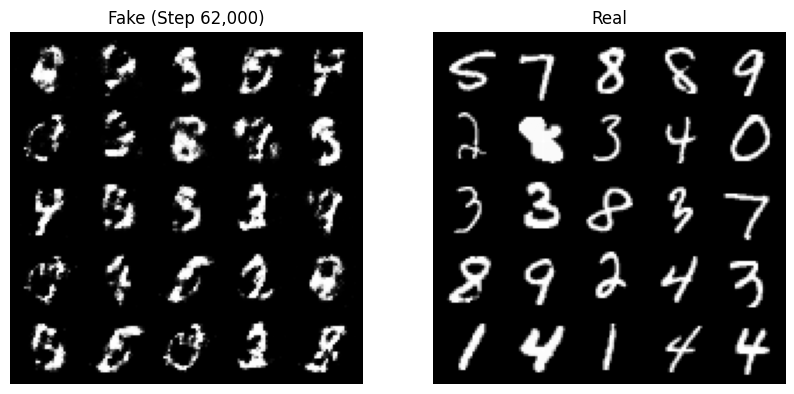

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63000: Generator loss: 1.749, discriminator loss: 0.3852


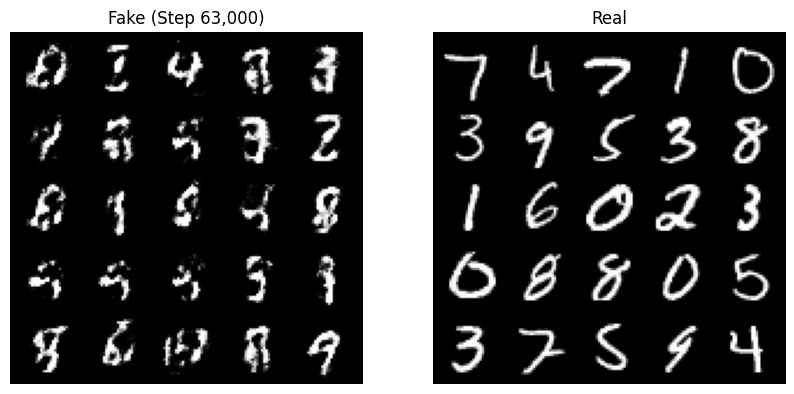

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64000: Generator loss: 1.621, discriminator loss: 0.4123


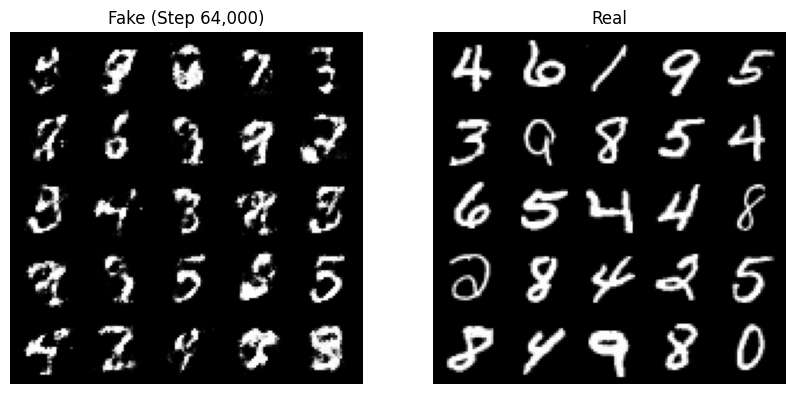

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65000: Generator loss: 1.676, discriminator loss: 0.4052


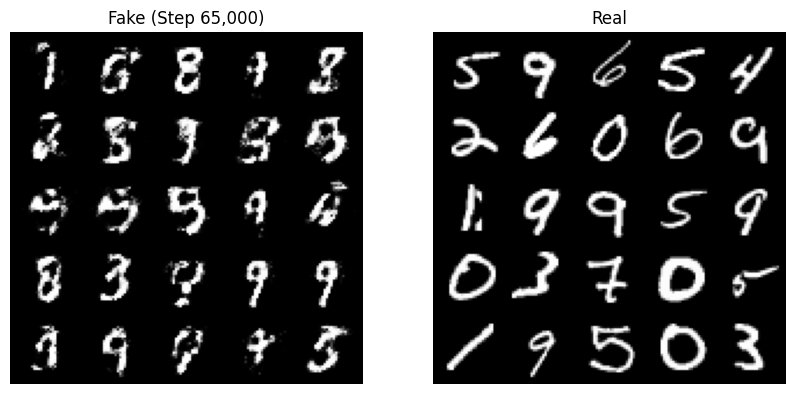

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66000: Generator loss: 1.743, discriminator loss: 0.3839


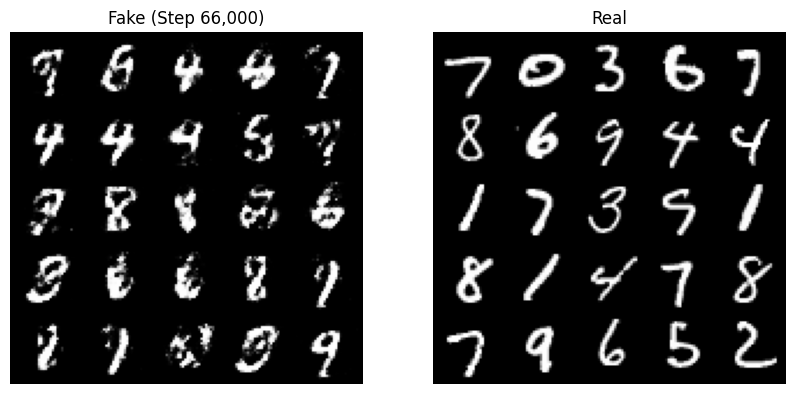

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67000: Generator loss: 1.648, discriminator loss: 0.4104


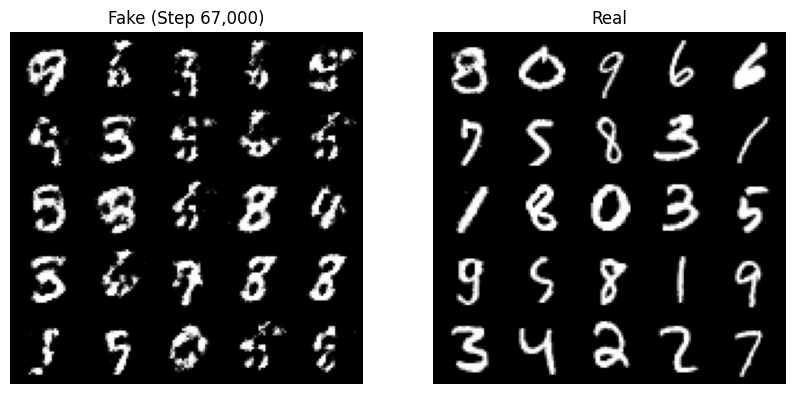

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68000: Generator loss: 1.611, discriminator loss: 0.415


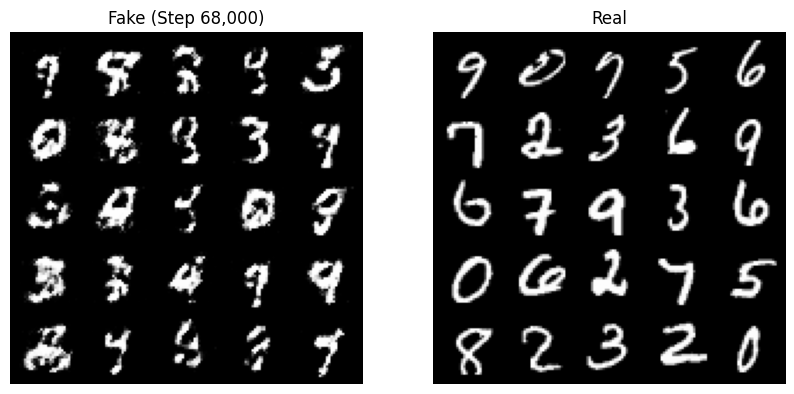

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69000: Generator loss: 1.579, discriminator loss: 0.4122


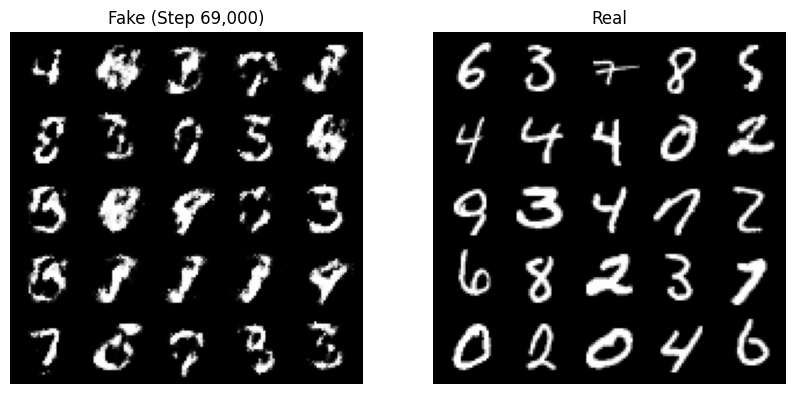

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70000: Generator loss: 1.613, discriminator loss: 0.4094


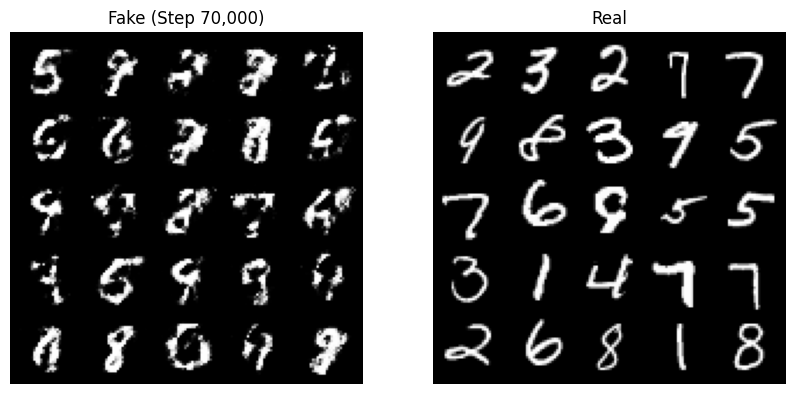

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71000: Generator loss: 1.593, discriminator loss: 0.4229


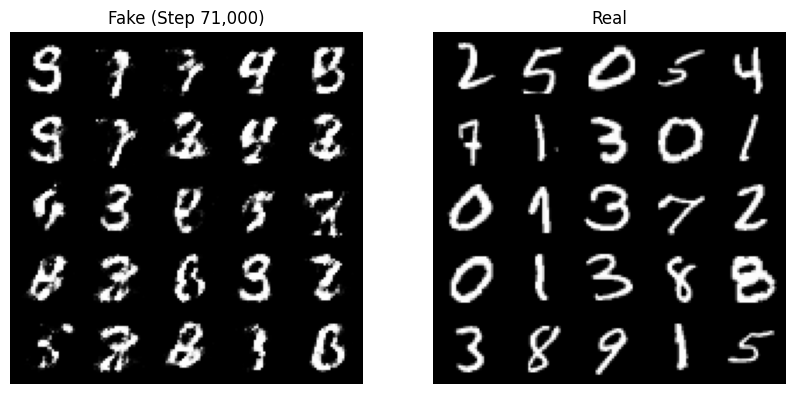

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72000: Generator loss: 1.63, discriminator loss: 0.4062


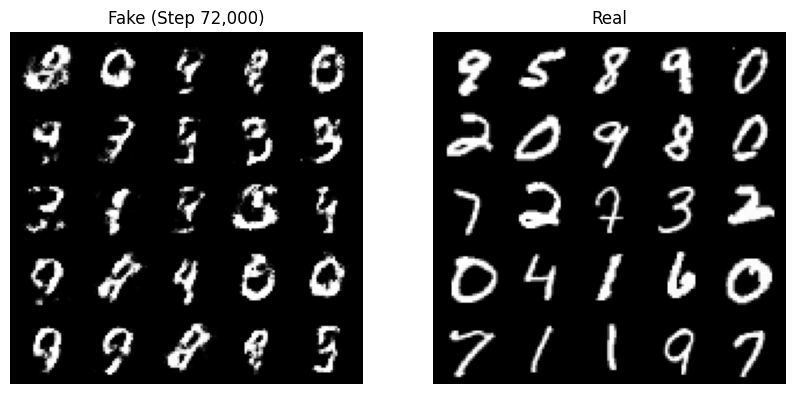

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73000: Generator loss: 1.602, discriminator loss: 0.4106


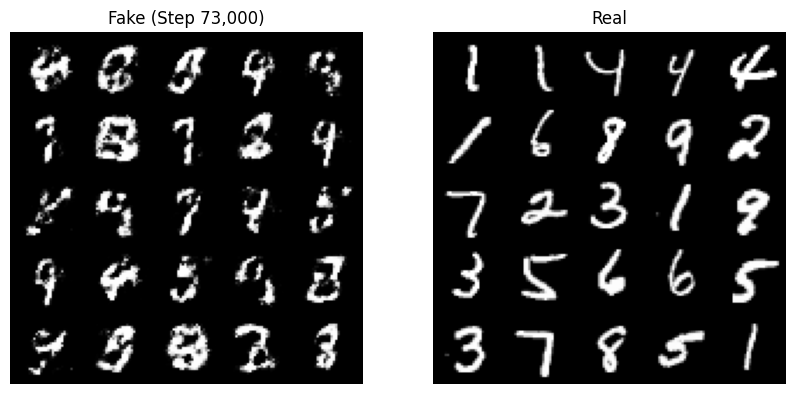

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74000: Generator loss: 1.606, discriminator loss: 0.4072


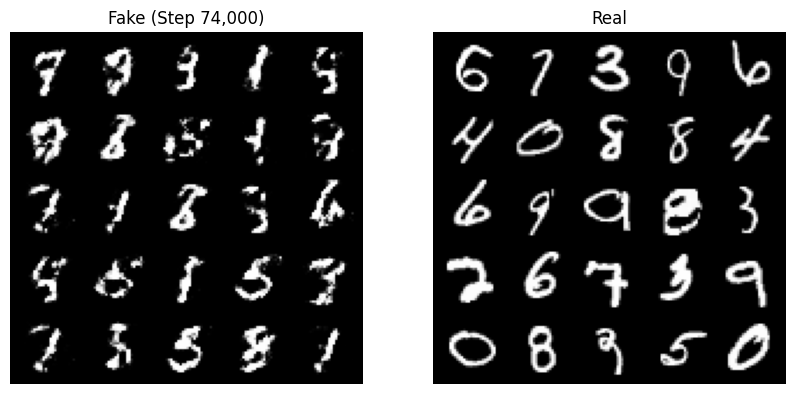

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75000: Generator loss: 1.581, discriminator loss: 0.4096


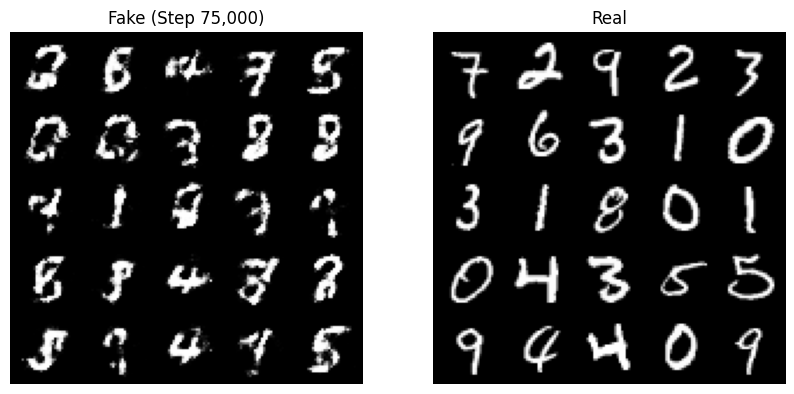

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76000: Generator loss: 1.558, discriminator loss: 0.4197


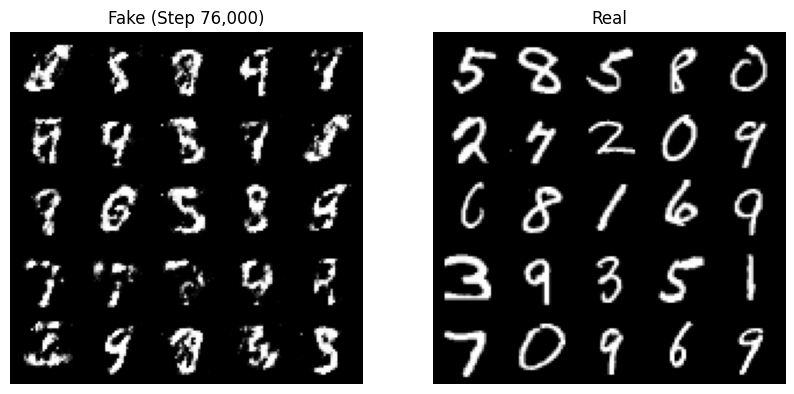

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77000: Generator loss: 1.535, discriminator loss: 0.423


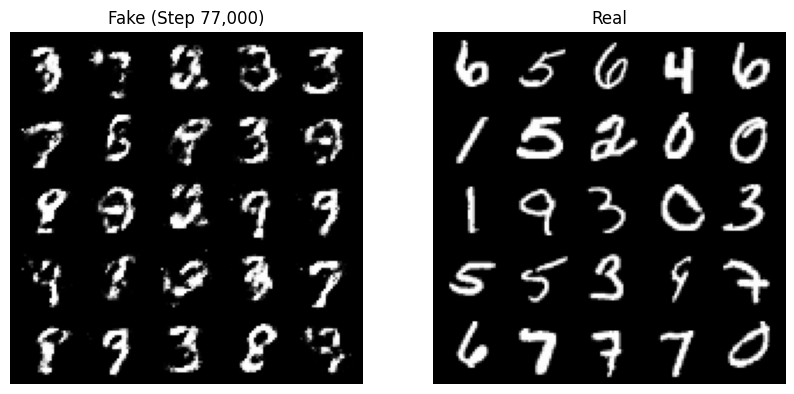

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78000: Generator loss: 1.486, discriminator loss: 0.4319


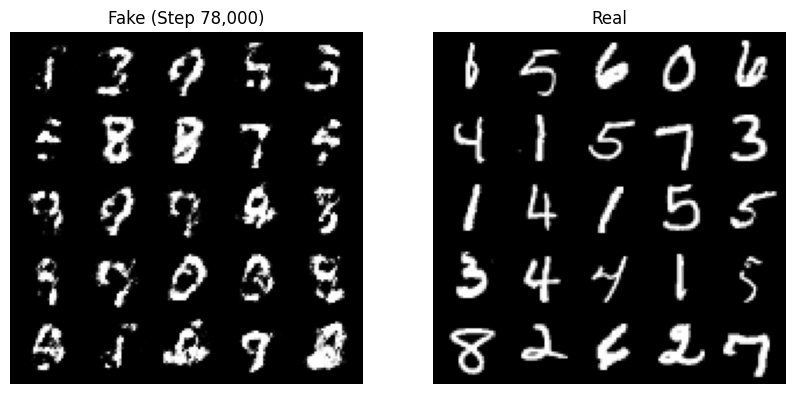

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79000: Generator loss: 1.447, discriminator loss: 0.4456


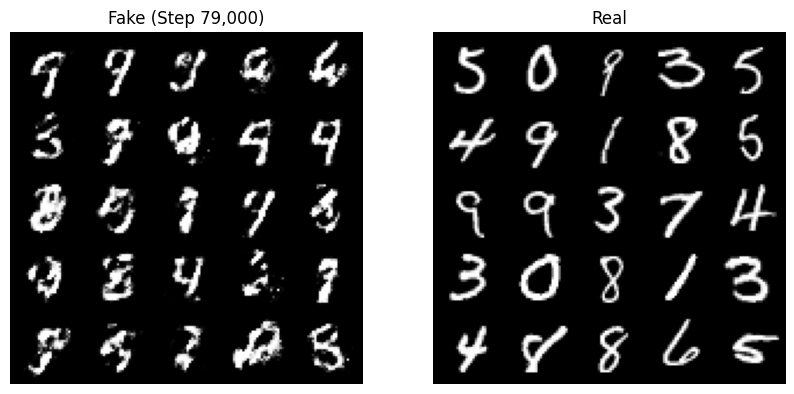

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80000: Generator loss: 1.409, discriminator loss: 0.4608


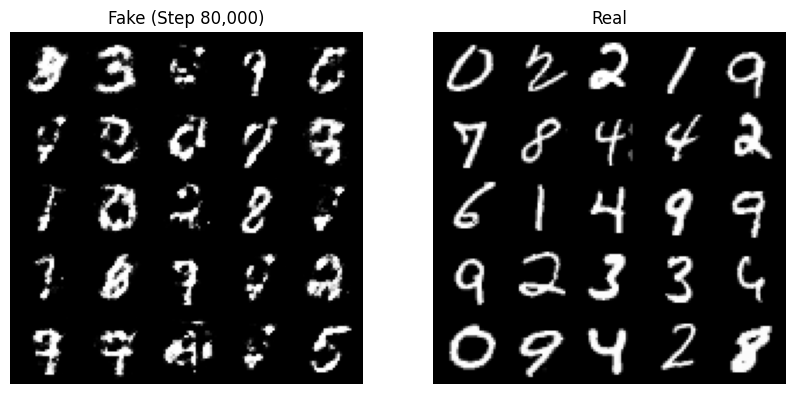

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81000: Generator loss: 1.366, discriminator loss: 0.4726


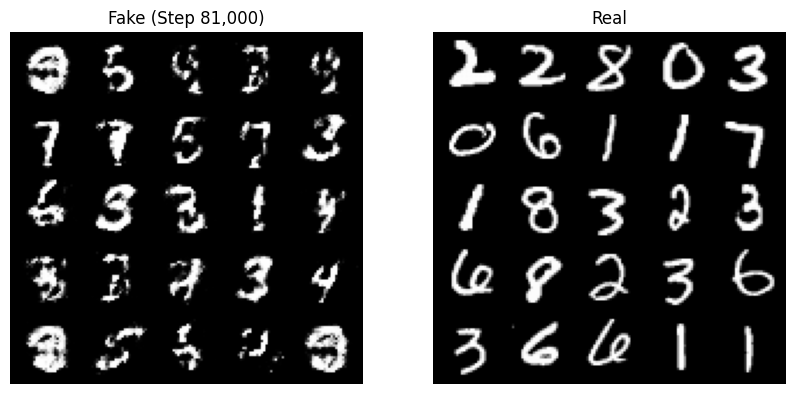

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82000: Generator loss: 1.404, discriminator loss: 0.4585


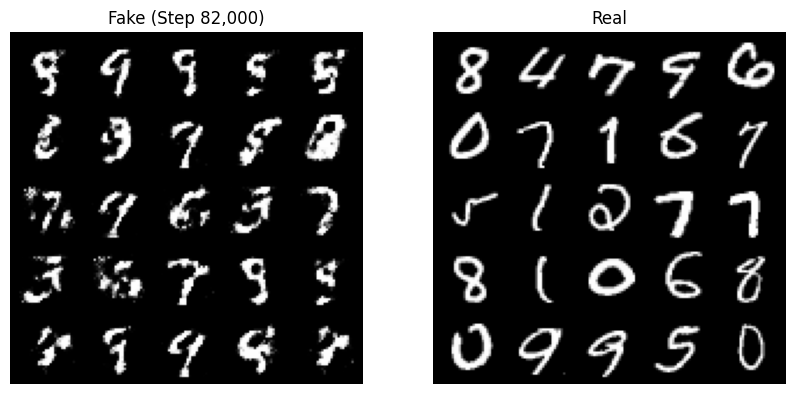

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83000: Generator loss: 1.413, discriminator loss: 0.464


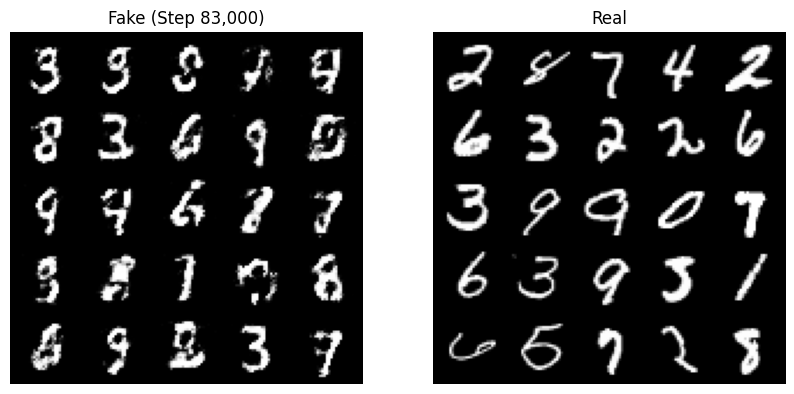

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84000: Generator loss: 1.407, discriminator loss: 0.4681


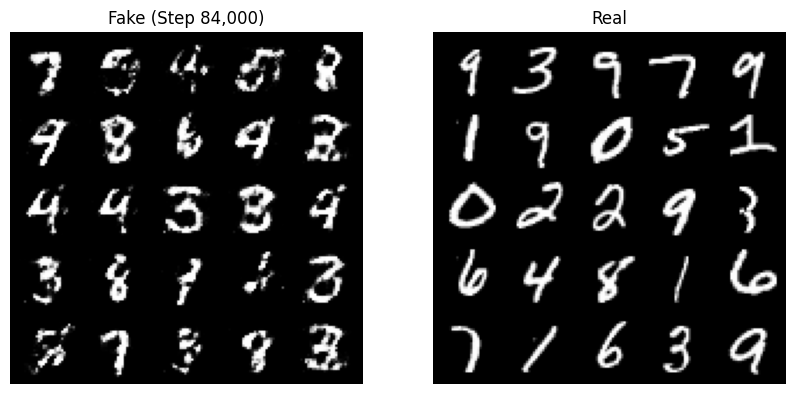

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85000: Generator loss: 1.357, discriminator loss: 0.4773


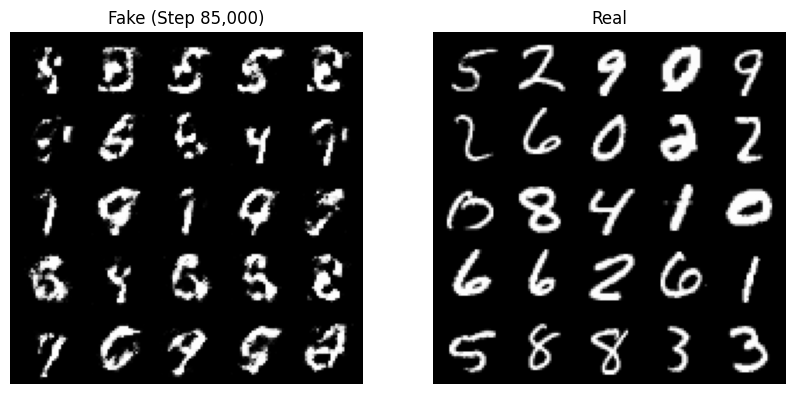

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86000: Generator loss: 1.291, discriminator loss: 0.4929


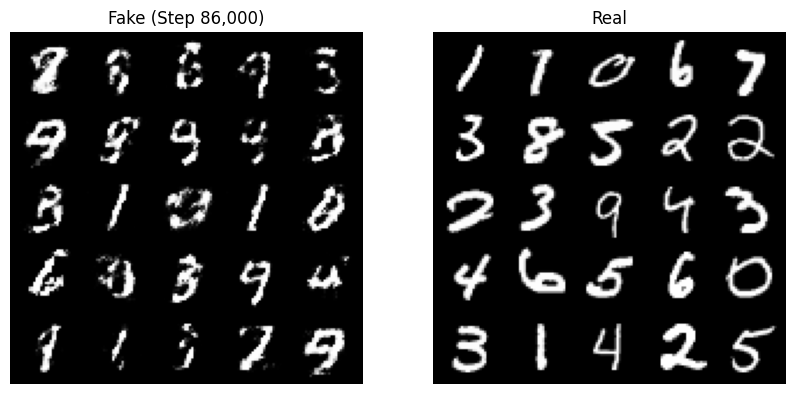

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87000: Generator loss: 1.346, discriminator loss: 0.462


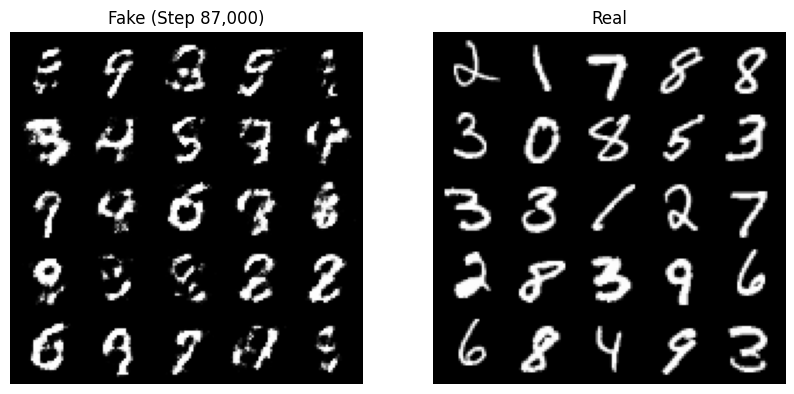

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88000: Generator loss: 1.326, discriminator loss: 0.4758


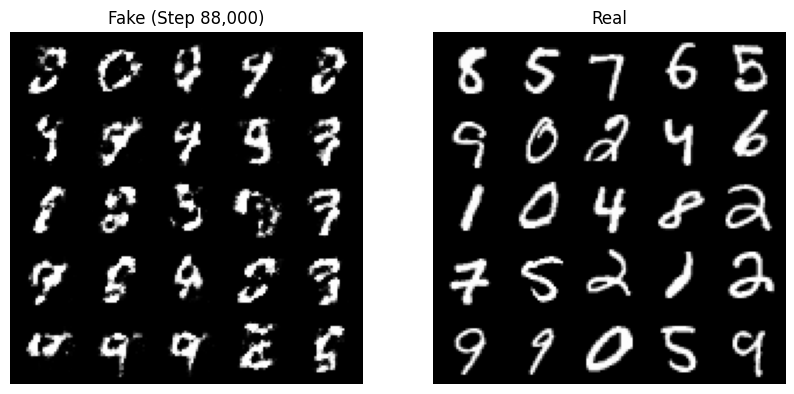

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89000: Generator loss: 1.387, discriminator loss: 0.4543


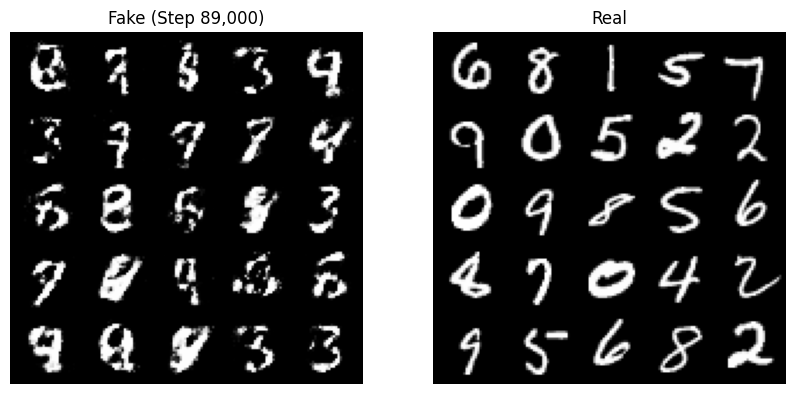

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90000: Generator loss: 1.33, discriminator loss: 0.4748


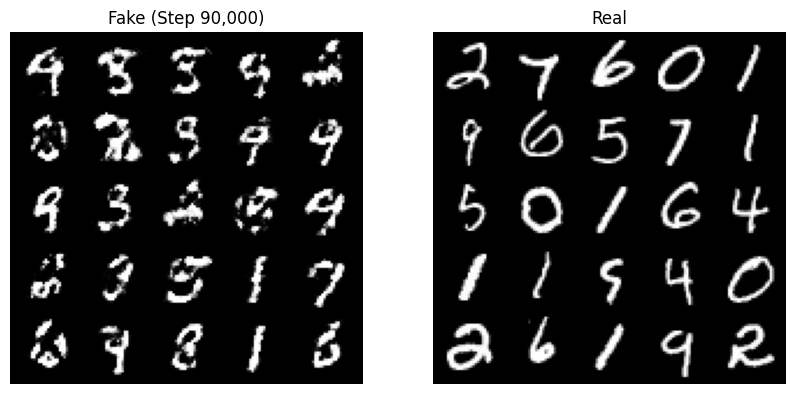

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91000: Generator loss: 1.323, discriminator loss: 0.4756


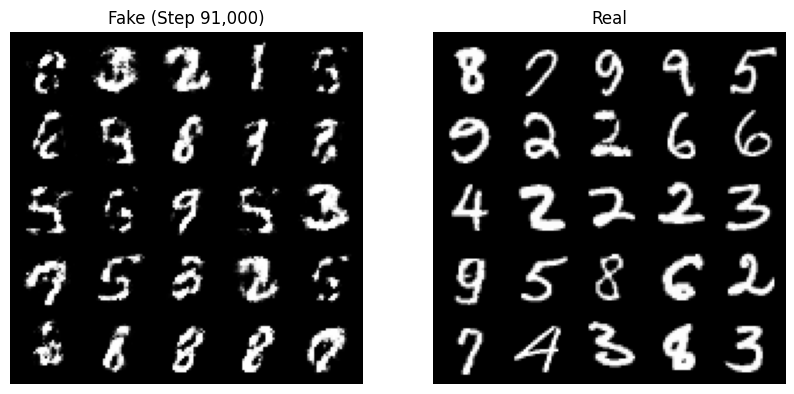

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92000: Generator loss: 1.359, discriminator loss: 0.4638


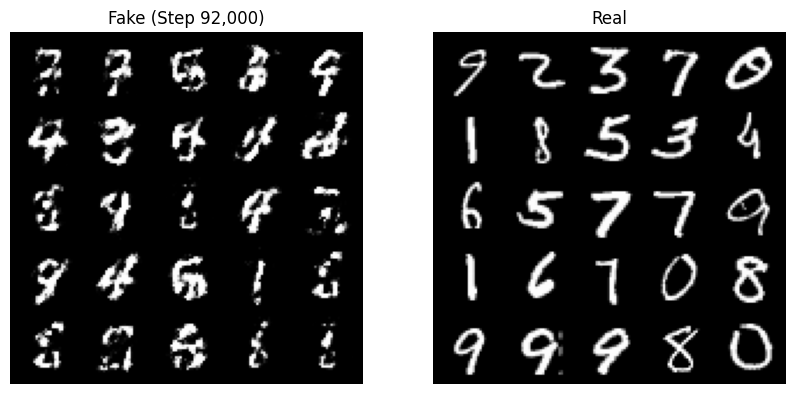

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93000: Generator loss: 1.344, discriminator loss: 0.4676


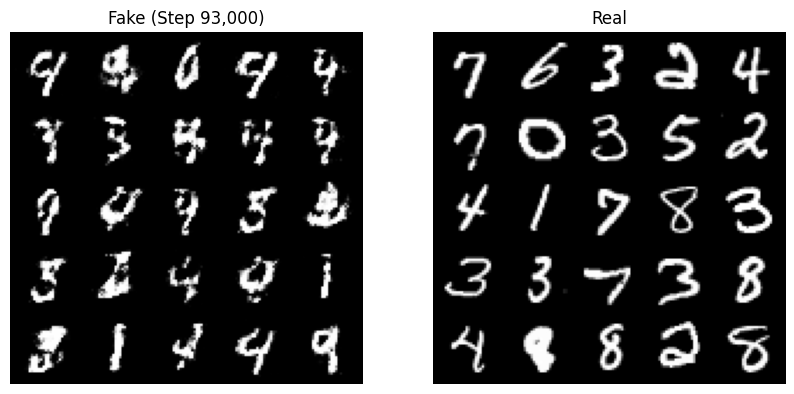

  0%|          | 0/469 [00:00<?, ?it/s]

In [29]:
# OPTIONAL PART
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = False # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):

    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss:0.4g}, discriminator loss: {mean_discriminator_loss:0.4g}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)

            fig, axes = plt.subplots(1, 2, figsize=(10, 5))
            show_tensor_images(fake, ax=axes[0], title=f"Fake (Step {cur_step:,})")
            show_tensor_images(real, ax=axes[1], title="Real")
            plt.show()

            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1


Se você não receber nenhum erro de execução, isso significa que seu código funciona.

Parabéns, você treinou sua GAN! 🎉